In [2]:
import pandas as pd
import plotly.express as px
from openai import OpenAI
import os
import matplotlib.pyplot as plt

In [50]:
dfS = pd.read_csv('/Users/kruthikhulisandra/Desktop/SpotifyProject/dfSCleaned.csv') #full dataset
dfAn = pd.read_csv('/Users/kruthikhulisandra/Desktop/SpotifyProject/df24.csv') #2024 dataframe


In [52]:
# Group by spotifyID, count occurrences, and sort by count in descending order
top_200_songs = (
    dfS.groupby(['spotifyID', 'track_name', 'artist_name'])  # Group by spotifyID, track_name, artist_name
    .size()  # Count occurrences
    .reset_index(name='count')  # Create a 'count' column
    .sort_values(by='count', ascending=False)  # Sort by count in descending order
    .head(200)  # Take the top 50 rows
)

# Now top_50_df is a DataFrame containing the top 50 rows
top_200_songs


,spotifyID,track_name,artist_name,count
5340,3fpl1wp5GcuomLNPiLwgcH,1NIGHT - Maazel & Jupom Remix,yetep,218
4197,2rOfnCrbxZpMvENtx8LqY9,Gravity,yetep,204
4327,2wn0zWnPeDnlY7Ue0i0OnR,Into My Heart (feat. GLNNA),yetep,157
5920,4548LyFomXQmDAINcFizEq,Learn To Love Again,Audien,147
2978,21kVD9H40rRQkGmcMi01Fl,First Place,yetep,145
...,...,...,...,...
10777,7g7w1Xs3cZehtN1e0kUnSo,A Way To Say Goodbye - Ricky Mears Remix,Seven Lions,53
11149,7vWFaMq63AwkFDhS2OAg5u,The Time (Dirty Bit),Black Eyed Peas,52
8720,60lVHKWmvmsJlv14Xw0mdO,Divine,ZEXTONE,52
7648,5FvGI8KtImlEbOsvEW3pfX,The Fall,The Chainsmokers,52


In [54]:
# Group by artist_name and count occurrences
top_50_artists = (
    dfS.groupby('artist_name')  # Group by artist_name
    .agg(
        playCount=('spotifyID', 'count'),  # Total count of spotifyIDs
        numofSongs=('spotifyID', 'nunique')  # Unique count of spotifyIDs
    )
    .reset_index()  # Reset index to get a flat DataFrame
    .sort_values(by='playCount', ascending=False)  # Sort by total count in descending order
    .head(50)  # Select the top 50 artists
)

# Display the top artists with their counts
top_50_artists


,artist_name,playCount,numofSongs
3536,yetep,2070,76
422,Big Sean,1345,116
1295,ILLENIUM,1189,133
2455,Pritam,1181,132
254,Arijit Singh,1160,94
74,ASMR Glow,899,307
2761,Seven Lions,824,77
1978,Maroon 5,743,56
536,Calvin Harris,670,75
301,Audien,666,44


In [64]:
# Calculate the average of hours_played
average_hours_played = dfS['ms_played'].mean()

# Create an interactive line chart with hours_played
fig = px.line(
    ms_played,
    x='date',
    y='hours_played',
    title='Daily Aggregation of Hours Played with Interactive Average Line',
    labels={'date': 'Date', 'hours_played': 'Hours Played'}
)

# Add the average line as a separate trace
fig.add_scatter(
    x=[ms_played['date'].min(), ms_played['date'].max()],
    y=[average_hours_played, average_hours_played],
    mode='lines',
    line=dict(color='red', width=2, dash='dash'),
    name=f'Average: {average_hours_played:.2f} Hours'
)

# Add interactivity for selecting date ranges
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=[
            dict(count=1, label='1m', step='month', stepmode='backward'),
            dict(count=6, label='6m', step='month', stepmode='backward'),
            dict(count=1, label='1y', step='year', stepmode='backward'),
            dict(step='all')
        ]
    )
)

# Adjust the legend position to display clearly
fig.update_layout(
    legend=dict(
        title="Legend",
        orientation="v",
        x=1.02,  # Pushes the legend to the right side
        y=1,
        xanchor="left",
        yanchor="top"
    )
)

# Show the interactive plot
fig.show()


KeyError: 'hours_played'

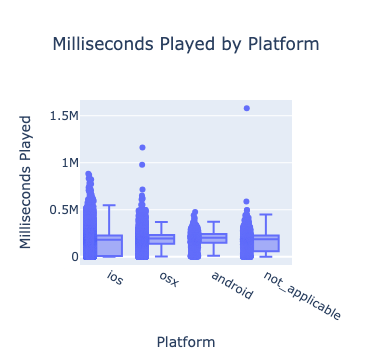

In [60]:


# Ensure ms_played and platform columns exist and have valid data
dfS['ms_played'] = pd.to_numeric(dfS['ms_played'], errors='coerce')  # Convert ms_played to numeric
dfS['platform'] = dfS['platform'].astype(str)  # Ensure platform is a string

# Create a box plot
fig = px.box(
    dfS,
    x='platform',
    y='ms_played',
    title='Milliseconds Played by Platform',
    labels={'platform': 'Platform', 'ms_played': 'Milliseconds Played'},
    points='all'  # Show all data points (jittered) on the plot
)

# Customize layout for better readability
fig.update_layout(
    xaxis_title='Platform',
    yaxis_title='Milliseconds Played',
    boxmode='group',  # Group by platform
    title_x=0.5  # Center the title
)

# Show the plot
fig.show()


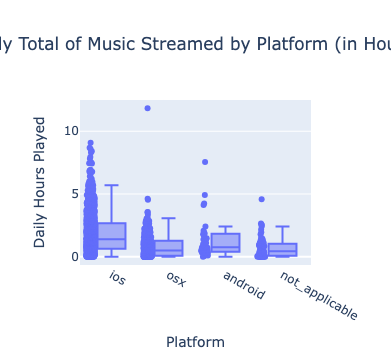

In [58]:
# Group the data by date and platform to calculate daily totals
daily_streamed = (
    dfS.groupby([pd.to_datetime(dfS['date'], errors='coerce'), 'platform'])['ms_played']
    .sum()
    .reset_index(name='daily_ms_played')
)

# Convert milliseconds to hours
daily_streamed['daily_hours_played'] = daily_streamed['daily_ms_played'] / 3_600_000

# Create a box plot grouped by platform
fig = px.box(
    daily_streamed,
    x='platform',
    y='daily_hours_played',
    title='Daily Total of Music Streamed by Platform (in Hours)',
    labels={'platform': 'Platform', 'daily_hours_played': 'Daily Hours Played'},
    points='all'  # Show all data points (jittered) on the plot
)

# Customize layout for better readability
fig.update_layout(
    xaxis_title='Platform',
    yaxis_title='Daily Hours Played',
    boxmode='group',  # Group by platform
    title_x=0.5  # Center the title
)

# Show the plot
fig.show()


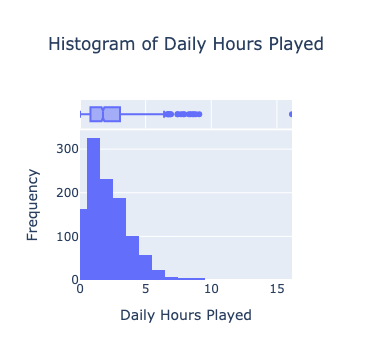

In [66]:
# Group the data by date and platform to calculate daily totals
daily_streamed = (
    dfS.groupby(pd.to_datetime(dfS['date'], errors='coerce'))['ms_played']
    .sum()
    .reset_index(name='daily_ms_played')
)

# Convert milliseconds to hours
daily_streamed['daily_hours_played'] = daily_streamed['daily_ms_played'] / 3_600_000

# Create a histogram for daily hours played with bins starting at 0
fig = px.histogram(
    daily_streamed,
    x='daily_hours_played',
    nbins=24,  # Create bins for each hour
    title='Histogram of Daily Hours Played',
    labels={'daily_hours_played': 'Daily Hours Played'},
    marginal='box',  # Optional: add a box plot on top for summary statistics
    range_x=[0, daily_streamed['daily_hours_played'].max()]  # Ensure bins start at 0
)

# Customize layout for better readability
fig.update_layout(
    xaxis_title='Daily Hours Played',
    yaxis_title='Frequency',
    title_x=0.5  # Center the title
)

# Show the plot
fig.show()


In [68]:
platform_counts = dfS['platform'].value_counts().reset_index()
platform_counts.columns = ['platform', 'count']

platform_counts

,platform,count
0,ios,47591
1,osx,5603
2,not_applicable,1298
3,android,900


In [70]:
# Count occurrences of each distinct conn_country
country_counts = dfS['conn_country'].value_counts().reset_index()
country_counts.columns = ['conn_country', 'count']

# Display the result
country_counts

,conn_country,count
0,US,54432
1,IN,891
2,DO,69


In [ ]:
#everything past this line is 2024 data only

In [72]:
dfAn['reason_start'].unique()

array(['fwdbtn', 'trackdone', 'clickrow', 'backbtn', 'appload', 'playbtn',
       'remote', 'trackerror', 'unknown'], dtype=object)

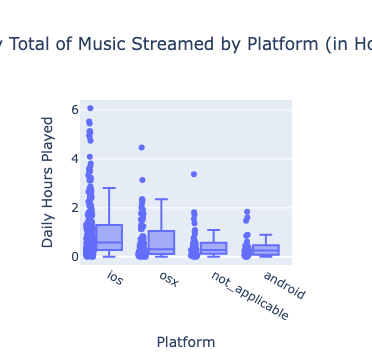

In [74]:
# Group the data by date and platform to calculate daily totals
daily_streamed = (
    dfAn.groupby([pd.to_datetime(dfAn['date'], errors='coerce'), 'platform'])['ms_played']
    .sum()
    .reset_index(name='daily_ms_played')
)

# Convert milliseconds to hours
daily_streamed['daily_hours_played'] = daily_streamed['daily_ms_played'] / 3_600_000

# Create a box plot grouped by platform
fig = px.box(
    daily_streamed,
    x='platform',
    y='daily_hours_played',
    title='Daily Total of Music Streamed by Platform (in Hours)',
    labels={'platform': 'Platform', 'daily_hours_played': 'Daily Hours Played'},
    points='all'  # Show all data points (jittered) on the plot
)

# Customize layout for better readability
fig.update_layout(
    xaxis_title='Platform',
    yaxis_title='Daily Hours Played',
    boxmode='group',  # Group by platform
    title_x=0.5  # Center the title
)

# Show the plot
fig.show()


In [76]:
dfAn.groupby('platform')['energy'].mean().reset_index(name='average_energy')



,platform,average_energy
0,android,0.600251
1,ios,0.638813
2,not_applicable,0.654429
3,osx,0.655465


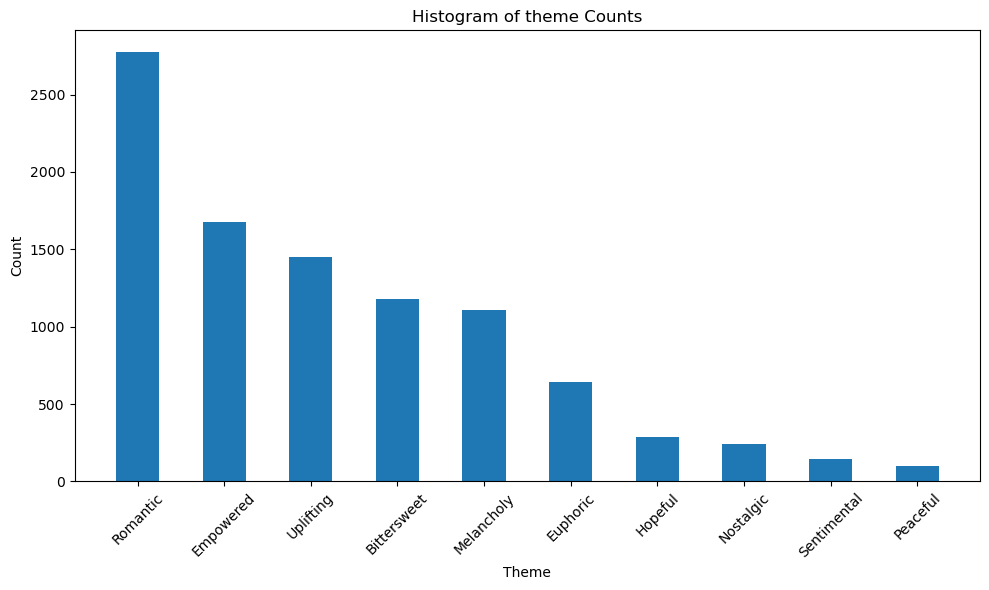

In [78]:


# Count the occurrences of each theme
theme_counts = dfAn['theme'].value_counts()

# Create a histogram
plt.figure(figsize=(10, 6))
plt.bar(theme_counts.index, theme_counts.values, width=0.5)

# Customize the plot
plt.title('Histogram of theme Counts')
plt.xlabel('Theme')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()

# Show the plot
plt.show()


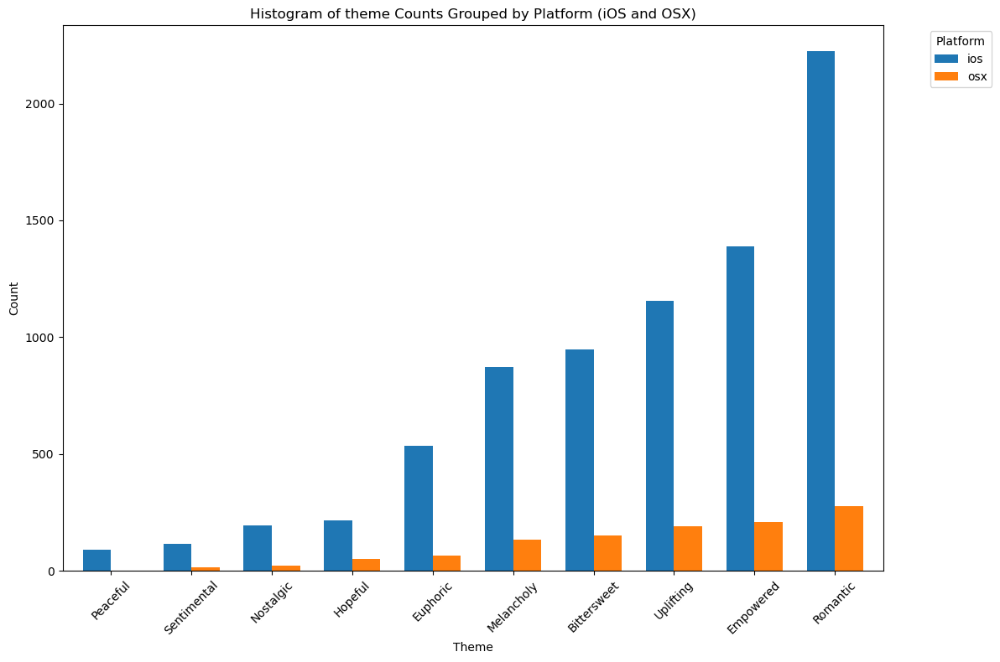

In [80]:
import matplotlib.pyplot as plt

# Filter the data to only include 'ios' and 'osx'
dfAn_filtered = dfAn[dfAn['platform'].isin(['ios', 'osx'])]

# Group by platform and theme, then count occurrences
grouped_themes_filtered = dfAn_filtered.groupby(['platform', 'theme']).size().reset_index(name='count')

# Pivot the data for plotting
pivot_themes_filtered = grouped_themes_filtered.pivot(index='theme', columns='platform', values='count').fillna(0)

# Sort the pivot table by the 'ios' column in ascending order
pivot_themes_filtered = pivot_themes_filtered.sort_values(by='ios', ascending=True)

# Plot the histogram
pivot_themes_filtered.plot(kind='bar', figsize=(12, 8), width=0.7)

# Customize the plot
plt.title('Histogram of theme Counts Grouped by Platform (iOS and OSX)')
plt.xlabel('Theme')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Platform', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()


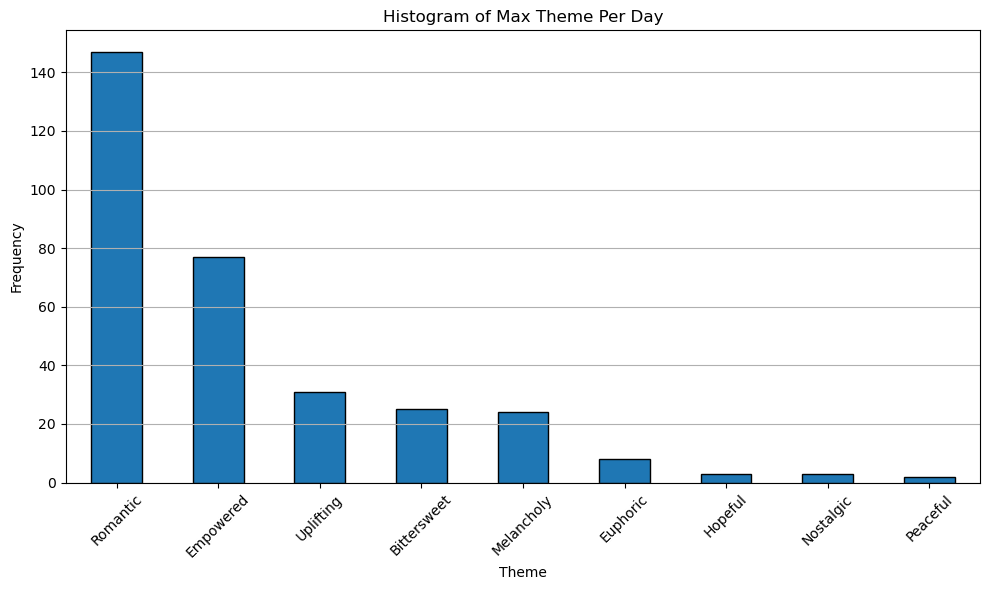

In [82]:
# Group by date and find the mode (most frequent theme) per day
max_theme_per_day = dfAn.groupby('date')['theme'].agg(lambda x: x.mode()[0])

# Plot histogram of the max theme per day
plt.figure(figsize=(10, 6))
max_theme_per_day.value_counts().plot(kind='bar', edgecolor='black')
plt.title('Histogram of Max Theme Per Day')
plt.xlabel('Theme')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


In [84]:
max_theme_per_day.value_counts().sum()

320

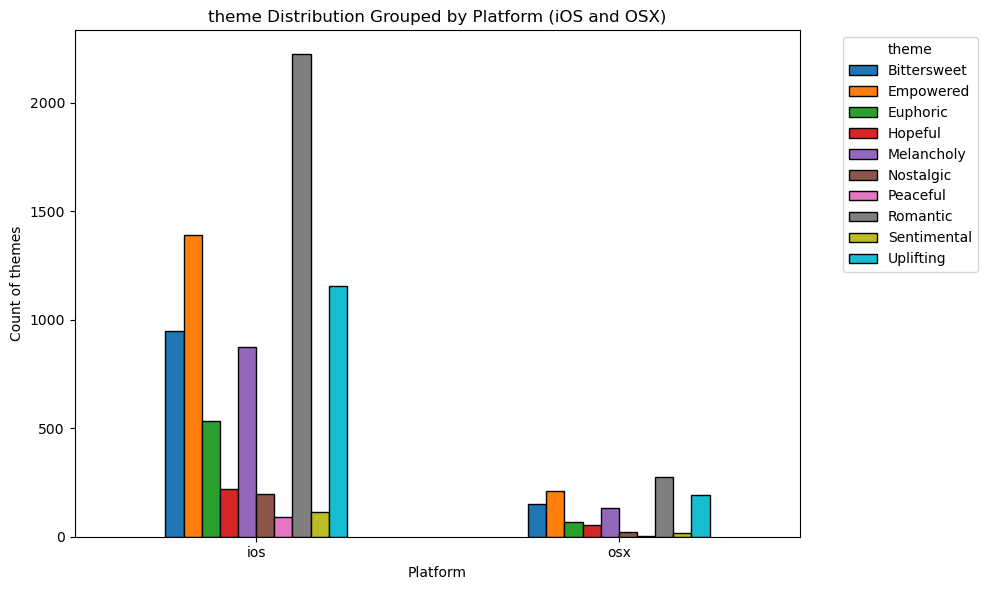

In [86]:


# Filter data for ios and osx platforms
grouped_data = dfAn[dfAn['platform'].isin(['ios', 'osx'])].groupby(['platform', 'theme']).size().unstack()

# Plotting the double bar graph
grouped_data.plot(kind='bar', figsize=(10, 6), edgecolor='black')
plt.title('theme Distribution Grouped by Platform (iOS and OSX)')
plt.xlabel('Platform')
plt.ylabel('Count of themes')
plt.xticks(rotation=0)
plt.legend(title='theme', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [88]:
# Calculate the average energy level for each theme
theme_avg_energy = dfAn.groupby('theme')['energy'].mean()

# Sort themes by average energy level (highest to lowest)
theme_order = theme_avg_energy.sort_values(ascending=True).index

theme_order

Index(['Peaceful', 'Romantic', 'Bittersweet', 'Sentimental', 'Melancholy',
       'Hopeful', 'Nostalgic', 'Uplifting', 'Empowered', 'Euphoric'],
      dtype='object', name='theme')

In [90]:
# Convert 'time' column to time type
dfAn['time'] = pd.to_datetime(dfAn['time'], format='%H:%M:%S').dt.time

# Display the updated dataframe info to confirm the change
print("Updated Dataframe with 'time' as time type:")
print(dfAn.info())



Updated Dataframe with 'time' as time type:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9594 entries, 0 to 9593
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      9594 non-null   int64  
 1   date            9594 non-null   object 
 2   time            9594 non-null   object 
 3   conn_country    9594 non-null   object 
 4   platform        9594 non-null   object 
 5   track_name      9594 non-null   object 
 6   artist_name     9594 non-null   object 
 7   album_name      9594 non-null   object 
 8   ms_played       9594 non-null   int64  
 9   spotifyID       9594 non-null   object 
 10  reason_start    9594 non-null   object 
 11  reason_end      9594 non-null   object 
 12  shuffle         9594 non-null   bool   
 13  skipped         9594 non-null   bool   
 14  offline         9594 non-null   bool   
 15  incognito_mode  9594 non-null   bool   
 16  play_count      9594 non-null   in

In [92]:
# Map themes to numeric values based on theme_order
theme_to_num = {theme: i for i, theme in enumerate(theme_order)}
num_to_theme = {i: theme for theme, i in theme_to_num.items()}  # Reverse mapping for y-axis labels

# Convert themes in filtered_daily_max_theme to numeric values
numeric_theme_values = filtered_daily_max_theme.map(theme_to_num)

# Start plotting
plt.figure(figsize=(12, 6))

# Plot the trend line (connecting the dots)
plt.plot(numeric_theme_values.index, numeric_theme_values, color='gray', alpha=0.5, linestyle='--', label='Trend Line')

# Scatter plot with correct numeric mapping
for date, num in numeric_theme_values.items():
    plt.scatter(date, num, color=theme_colors[num_to_theme[num]], s=50)

# Create a manual legend to match scatterplot points
handles = [plt.Line2D([0], [0], marker='o', color=theme_colors[theme], label=theme, linestyle='None') 
           for theme in theme_order]
plt.legend(handles=handles, title="Theme", bbox_to_anchor=(1.05, 1), loc='upper left')

# Customize plot
plt.title("Daily Max Theme with Corresponding Colors (320 Entries)", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Theme", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(range(len(theme_order)), theme_order)  # Properly map numeric values back to themes
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


NameError: name 'filtered_daily_max_theme' is not defined

In [94]:
# Calculate average energy for each theme
average_energy = dfAn.groupby('theme')['energy'].mean()

# Map themes to numeric values based on theme_order
theme_to_num = {theme: i for i, theme in enumerate(theme_order)}
num_to_theme = {i: theme for theme, i in theme_to_num.items()}  # Reverse mapping for y-axis labels

# Convert themes in filtered_daily_max_theme to numeric values
numeric_theme_values = filtered_daily_max_theme.map(theme_to_num)

# Start plotting
plt.figure(figsize=(12, 6))

# Plot the trend line (connecting the dots)
plt.plot(numeric_theme_values.index, numeric_theme_values, color='gray', alpha=0.5, linestyle='--', label='Trend Line')

# Scatter plot with correct numeric mapping
for date, num in numeric_theme_values.items():
    plt.scatter(date, num, color=theme_colors[num_to_theme[num]], s=50)

# Create a manual legend with average energy values
handles = [
    plt.Line2D(
        [0], [0],
        marker='o',
        color=theme_colors[theme],
        label=f"{theme} (Avg Energy: {average_energy[theme]:.2f})",
        linestyle='None'
    )
    for theme in theme_order
]
plt.legend(handles=handles, title="Theme (Avg Energy)", bbox_to_anchor=(1.05, 1), loc='upper left')

# Customize plot
plt.title("Daily Max Theme with Corresponding Colors and Avg Energy (320 Entries)", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Theme", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(range(len(theme_order)), theme_order)  # Properly map numeric values back to themes
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


NameError: name 'filtered_daily_max_theme' is not defined

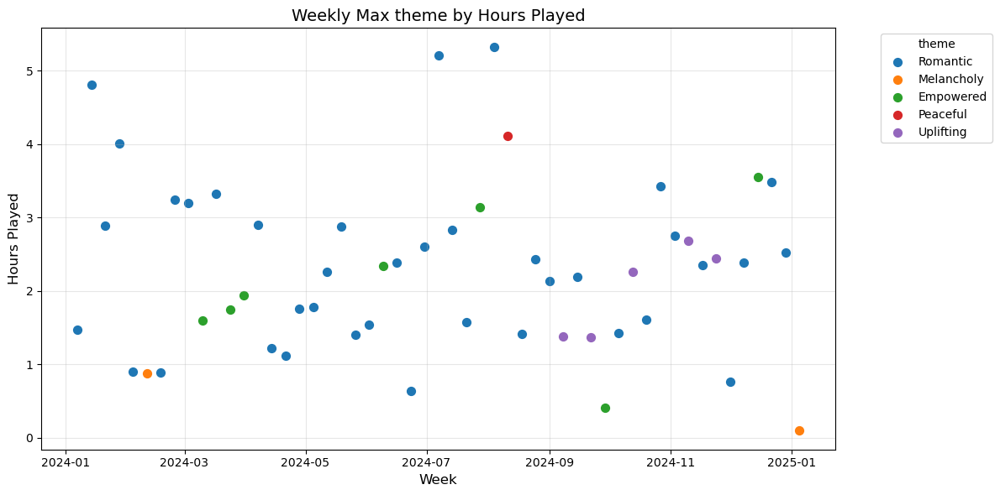

In [96]:
# Ensure 'date' column is in datetime format
dfAn['date'] = pd.to_datetime(dfAn['date'])

# Resample the data to weekly and sum the ms_played for each theme
weekly_data = dfAn.groupby([pd.Grouper(key='date', freq='W'), 'theme'])['ms_played'].sum().reset_index()

# Find the theme with the maximum ms_played each week
weekly_max_theme = weekly_data.loc[weekly_data.groupby('date')['ms_played'].idxmax()].reset_index(drop=True)

# Generate a color palette for 10 different colors
color_palette = plt.cm.tab10.colors

# Assign a color to each theme
theme_colors = {theme: color_palette[i % 10] for i, theme in enumerate(weekly_max_theme['theme'].unique())}

# Convert ms_played to hours
weekly_data['ms_played'] = weekly_data['ms_played'] / 3600000
weekly_max_theme['ms_played'] = weekly_max_theme['ms_played'] / 3600000

# Plot the time series with colors based on max theme
plt.figure(figsize=(12, 6))
for i, row in weekly_max_theme.iterrows():
    plt.scatter(row['date'], row['ms_played'], color=theme_colors[row['theme']], 
                label=row['theme'] if row['theme'] not in plt.gca().get_legend_handles_labels()[1] else "", s=50)

plt.title("Weekly Max theme by Hours Played", fontsize=14)
plt.xlabel("Week", fontsize=12)
plt.ylabel("Hours Played", fontsize=12)
plt.legend(title="theme", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning:

invalid value encountered in scalar divide

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning:

invalid value encountered in scalar divide



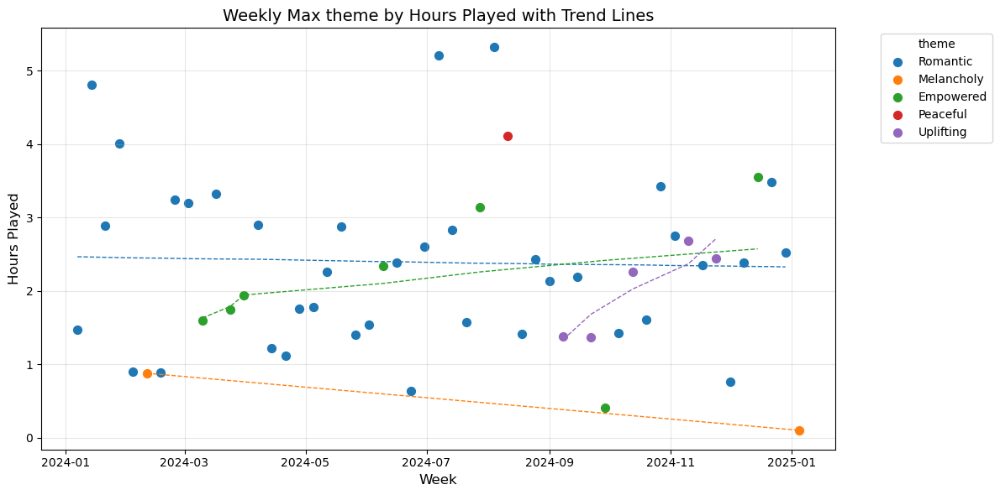

In [98]:
from scipy.stats import linregress
import numpy as np

# Convert ms_played to hours


# Prepare the plot
plt.figure(figsize=(12, 6))

# Add scatter plot and trend lines for each theme
for theme in weekly_max_theme['theme'].unique():
    theme_data = weekly_max_theme[weekly_max_theme['theme'] == theme]
    
    # Scatter plot for the theme
    plt.scatter(theme_data['date'], theme_data['ms_played'], 
                color=theme_colors[theme], label=theme, s=50)
    
    # Linear regression for the trend line
    x = np.arange(len(theme_data['date']))  # Use index for regression
    y = theme_data['ms_played']
    slope, intercept, _, _, _ = linregress(x, y)
    trend_line = slope * x + intercept
    
    # Plot the trend line
    plt.plot(theme_data['date'], trend_line, 
             color=theme_colors[theme], linestyle='--', linewidth=1)

# Add titles and labels
plt.title("Weekly Max theme by Hours Played with Trend Lines", fontsize=14)
plt.xlabel("Week", fontsize=12)
plt.ylabel("Hours Played", fontsize=12)
plt.legend(title="theme", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Not enough data points for regression on theme: Peaceful


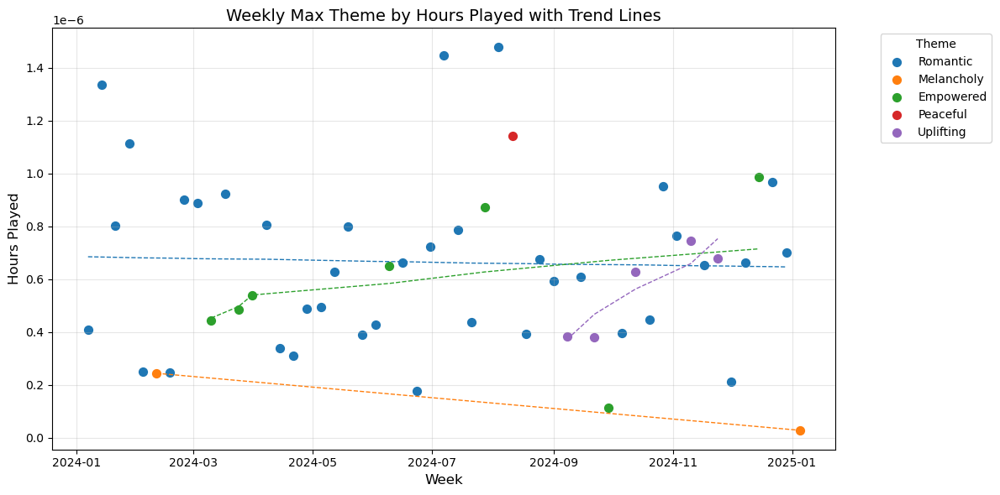

In [100]:
from scipy.stats import linregress
import numpy as np

# Convert ms_played to hours if necessary
weekly_max_theme['ms_played'] = weekly_max_theme['ms_played'] / 3600000  # Convert ms to hours

# Prepare the plot
plt.figure(figsize=(12, 6))

# Add scatter plot and trend lines for each theme
for theme in weekly_max_theme['theme'].unique():
    theme_data = weekly_max_theme[weekly_max_theme['theme'] == theme]
    
    # Drop NaNs or invalid rows
    theme_data = theme_data.dropna(subset=['ms_played', 'date'])
    
    # Scatter plot for the theme
    plt.scatter(theme_data['date'], theme_data['ms_played'], 
                color=theme_colors[theme], label=theme, s=50)
    
    # Linear regression for the trend line
    x = np.arange(len(theme_data))
    y = theme_data['ms_played'].values

    # Perform regression only if there are enough points
    if len(x) > 1:
        slope, intercept, _, _, _ = linregress(x, y)
        trend_line = slope * x + intercept
        
        # Plot the trend line
        plt.plot(theme_data['date'], trend_line, 
                 color=theme_colors[theme], linestyle='--', linewidth=1)
    else:
        print(f"Not enough data points for regression on theme: {theme}")

# Add titles and labels
plt.title("Weekly Max Theme by Hours Played with Trend Lines", fontsize=14)
plt.xlabel("Week", fontsize=12)
plt.ylabel("Hours Played", fontsize=12)
plt.legend(title="Theme", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


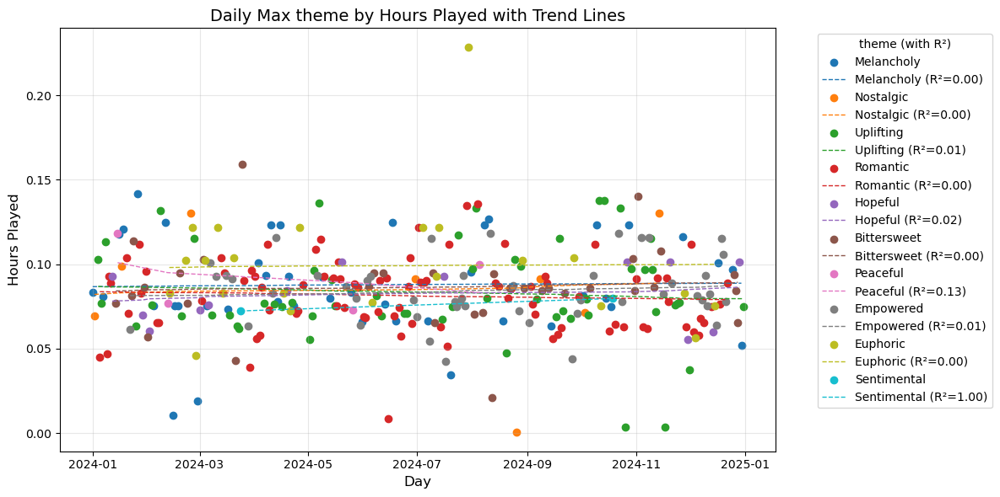

In [102]:
daily_max_theme = dfAn.loc[dfAn.groupby('date')['ms_played'].idxmax()].reset_index(drop=True)
daily_max_theme['ms_played'] = daily_max_theme['ms_played'] / 3600000  # Convert ms to hours

# Generate or update color palette for all themes
color_palette = plt.cm.tab10.colors
theme_colors = {theme: color_palette[i % 10] for i, theme in enumerate(daily_max_theme['theme'].unique())}

# Prepare the plot
plt.figure(figsize=(12, 6))

# Add scatter plot and trend lines for each theme
for theme in daily_max_theme['theme'].unique():
    theme_data = daily_max_theme[daily_max_theme['theme'] == theme]
    
    # Assign a color if it's not in the theme_colors dictionary
    if theme not in theme_colors:
        theme_colors[theme] = color_palette[len(theme_colors) % 10]
    
    # Scatter plot for the theme
    plt.scatter(theme_data['date'], theme_data['ms_played'], 
                color=theme_colors[theme], label=theme)
    
    # Linear regression for the trend line
    x = np.arange(len(theme_data['date']))  # Use index for regression
    y = theme_data['ms_played']
    slope, intercept, r_value, _, _ = linregress(x, y)
    trend_line = slope * x + intercept
    
    # Plot the trend line
    plt.plot(theme_data['date'], trend_line, 
             color=theme_colors[theme], linestyle='--', linewidth=1, 
             label=f"{theme} (R²={r_value**2:.2f})")

# Add titles and labels
plt.title("Daily Max theme by Hours Played with Trend Lines", fontsize=14)
plt.xlabel("Day", fontsize=12)
plt.ylabel("Hours Played", fontsize=12)
plt.legend(title="theme (with R²)", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning:

invalid value encountered in scalar divide

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning:

invalid value encountered in scalar divide

/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/3381846341.py:40: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.



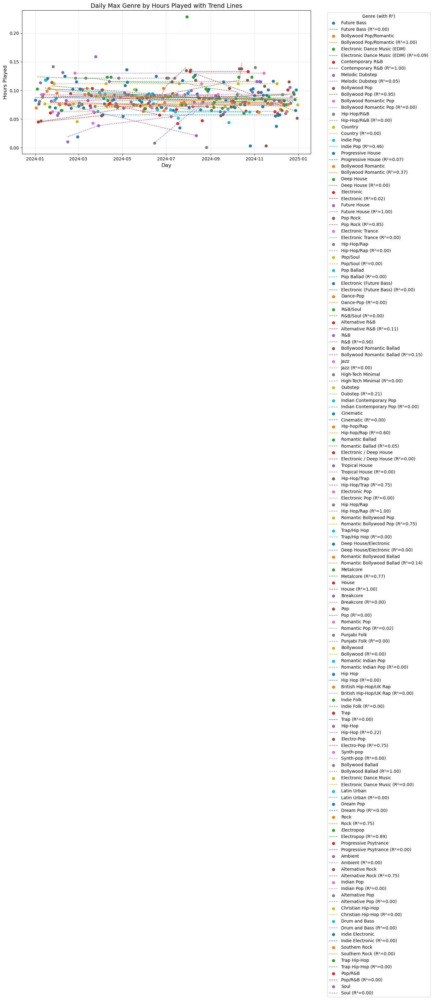

In [104]:
daily_max_genre = dfAn.loc[dfAn.groupby('date')['ms_played'].idxmax()].reset_index(drop=True)
daily_max_genre['ms_played'] = daily_max_genre['ms_played'] / 3600000  # Convert ms to hours

# Generate or update color palette for all genres
color_palette = plt.cm.tab10.colors
genre_colors = {genre: color_palette[i % 10] for i, genre in enumerate(daily_max_genre['genre'].unique())}

# Prepare the plot
plt.figure(figsize=(12, 6))

# Add scatter plot and trend lines for each genre
for genre in daily_max_genre['genre'].unique():
    genre_data = daily_max_genre[daily_max_genre['genre'] == genre]
    
    # Assign a color if it's not in the genre_colors dictionary
    if genre not in genre_colors:
        genre_colors[genre] = color_palette[len(genre_colors) % 10]
    
    # Scatter plot for the genre
    plt.scatter(genre_data['date'], genre_data['ms_played'], 
                color=genre_colors[genre], label=genre)
    
    # Linear regression for the trend line
    x = np.arange(len(genre_data['date']))  # Use index for regression
    y = genre_data['ms_played']
    slope, intercept, r_value, _, _ = linregress(x, y)
    trend_line = slope * x + intercept
    
    # Plot the trend line
    plt.plot(genre_data['date'], trend_line, 
             color=genre_colors[genre], linestyle='--', linewidth=1, 
             label=f"{genre} (R²={r_value**2:.2f})")

# Add titles and labels
plt.title("Daily Max Genre by Hours Played with Trend Lines", fontsize=14)
plt.xlabel("Day", fontsize=12)
plt.ylabel("Hours Played", fontsize=12)
plt.legend(title="Genre (with R²)", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
dfAn.info()

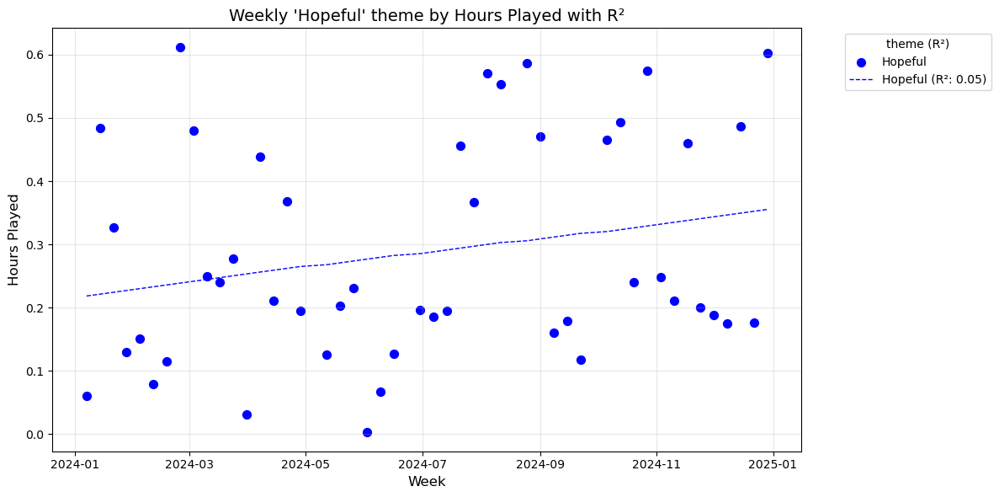

In [106]:
from scipy.stats import linregress
import numpy as np




# Filter data to include only 'hopeful' theme
hopeful_data = weekly_data[weekly_data['theme'] == 'Hopeful']

# Prepare the plot
plt.figure(figsize=(12, 6))

# Scatter plot for 'hopeful' theme
plt.scatter(hopeful_data['date'], hopeful_data['ms_played'], 
            color='blue', label='Hopeful', s=50)

# Linear regression for the trend line
x = np.arange(len(hopeful_data['date']))  # Use index for regression
y = hopeful_data['ms_played']
slope, intercept, r_value, _, _ = linregress(x, y)
trend_line = slope * x + intercept

# Plot the trend line
plt.plot(hopeful_data['date'], trend_line, 
         color='blue', linestyle='--', linewidth=1, 
         label=f"Hopeful (R²: {r_value**2:.2f})")

# Add titles and labels
plt.title("Weekly 'Hopeful' theme by Hours Played with R²", fontsize=14)
plt.xlabel("Week", fontsize=12)
plt.ylabel("Hours Played", fontsize=12)
plt.legend(title="theme (R²)", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


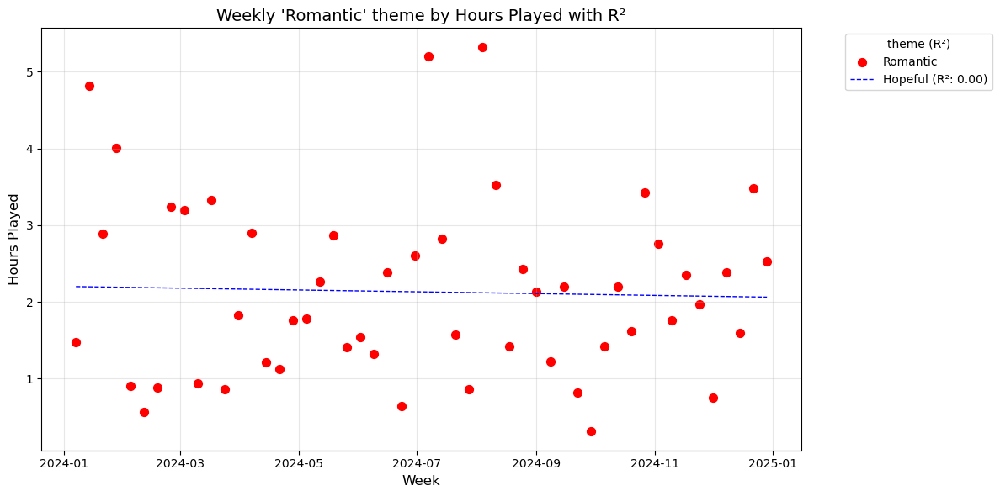

In [108]:
from scipy.stats import linregress
import numpy as np




# Filter data to include only 'hopeful' theme
romantic_data = weekly_data[weekly_data['theme'] == 'Romantic']

# Prepare the plot
plt.figure(figsize=(12, 6))

# Scatter plot for 'hopeful' theme
plt.scatter(romantic_data['date'], romantic_data['ms_played'], 
            color='red', label='Romantic', s=50)

# Linear regression for the trend line
x = np.arange(len(romantic_data['date']))  # Use index for regression
y = romantic_data['ms_played']
slope, intercept, r_value, _, _ = linregress(x, y)
trend_line = slope * x + intercept

# Plot the trend line
plt.plot(romantic_data['date'], trend_line, 
         color='blue', linestyle='--', linewidth=1, 
         label=f"Hopeful (R²: {r_value**2:.2f})")

# Add titles and labels
plt.title("Weekly 'Romantic' theme by Hours Played with R²", fontsize=14)
plt.xlabel("Week", fontsize=12)
plt.ylabel("Hours Played", fontsize=12)
plt.legend(title="theme (R²)", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/3799926403.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



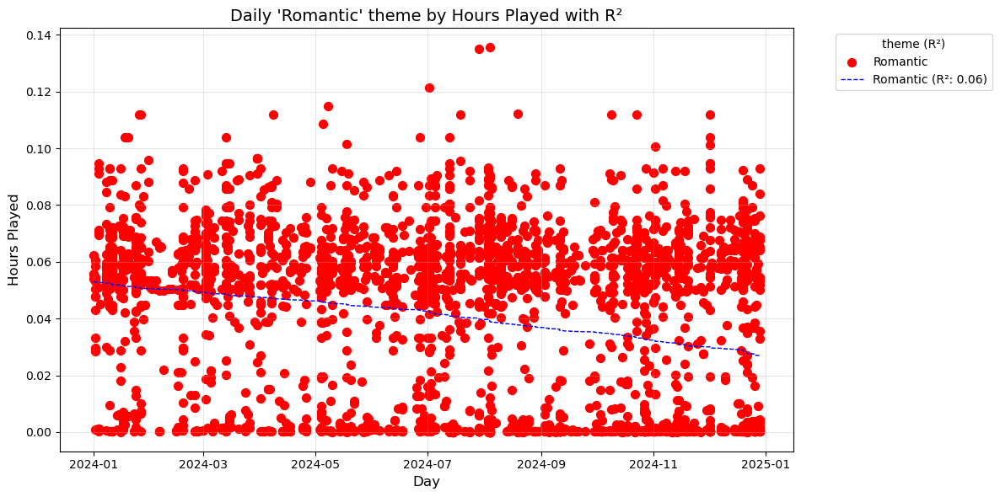

In [110]:
from scipy.stats import linregress
import numpy as np

# Filter data to include only 'Romantic' theme
romantic_data_daily = dfAn[dfAn['theme'] == 'Romantic']

# Convert ms_played to hours for the filtered data
romantic_data_daily['ms_played'] = romantic_data_daily['ms_played'] / 3600000

# Prepare the plot
plt.figure(figsize=(12, 6))

# Scatter plot for 'Romantic' theme
plt.scatter(romantic_data_daily['date'], romantic_data_daily['ms_played'], 
            color='red', label='Romantic', s=50)

# Linear regression for the trend line
x = np.arange(len(romantic_data_daily['date']))  # Use index for regression
y = romantic_data_daily['ms_played']
slope, intercept, r_value, _, _ = linregress(x, y)
trend_line = slope * x + intercept

# Plot the trend line
plt.plot(romantic_data_daily['date'], trend_line, 
         color='blue', linestyle='--', linewidth=1, 
         label=f"Romantic (R²: {r_value**2:.2f})")

# Add titles and labels
plt.title("Daily 'Romantic' theme by Hours Played with R²", fontsize=14)
plt.xlabel("Day", fontsize=12)
plt.ylabel("Hours Played", fontsize=12)
plt.legend(title="theme (R²)", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


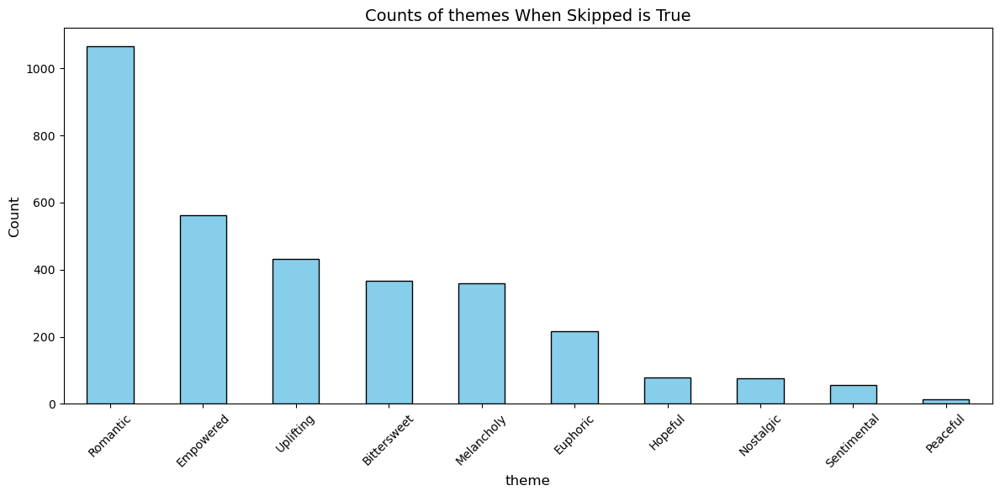

In [112]:
import matplotlib.pyplot as plt

# Filter the data where 'skipped' is True
skipped_data = dfAn[dfAn['skipped'] == True]

# Count occurrences of each theme
theme_counts = skipped_data['theme'].value_counts()

# Create a bar graph
plt.figure(figsize=(12, 6))
theme_counts.plot(kind='bar', color='skyblue', edgecolor='black')

# Add titles and labels
plt.title("Counts of themes When Skipped is True", fontsize=14)
plt.xlabel("theme", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()

# Display the plot
plt.show()


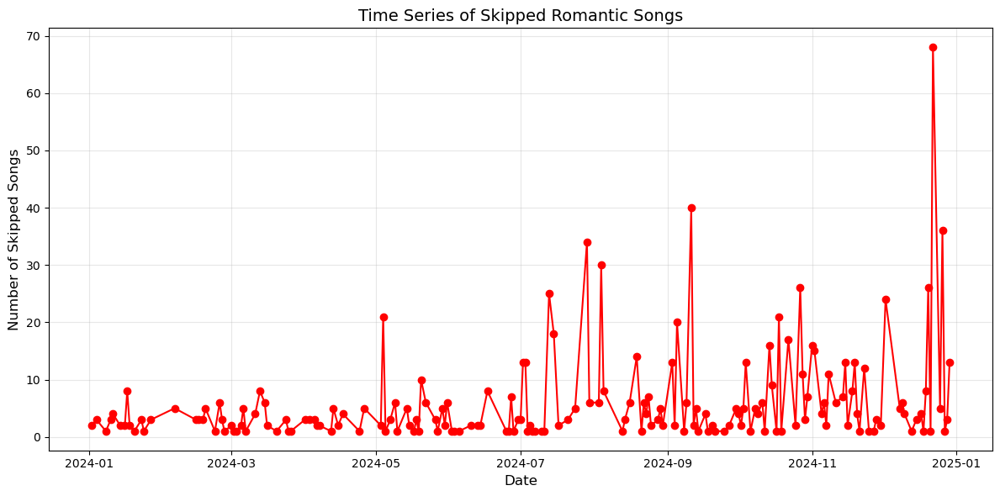

In [114]:
import matplotlib.pyplot as plt

# Filter data for 'Romantic' songs that were skipped
romantic_skipped = dfAn[(dfAn['theme'] == 'Romantic') & (dfAn['skipped'] == True)]

# Group by date and count the number of skipped songs per day
romantic_skipped_counts = romantic_skipped.groupby('date').size()

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(romantic_skipped_counts.index, romantic_skipped_counts.values, marker='o', linestyle='-', color='red')

# Add titles and labels
plt.title("Time Series of Skipped Romantic Songs", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Number of Skipped Songs", fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()


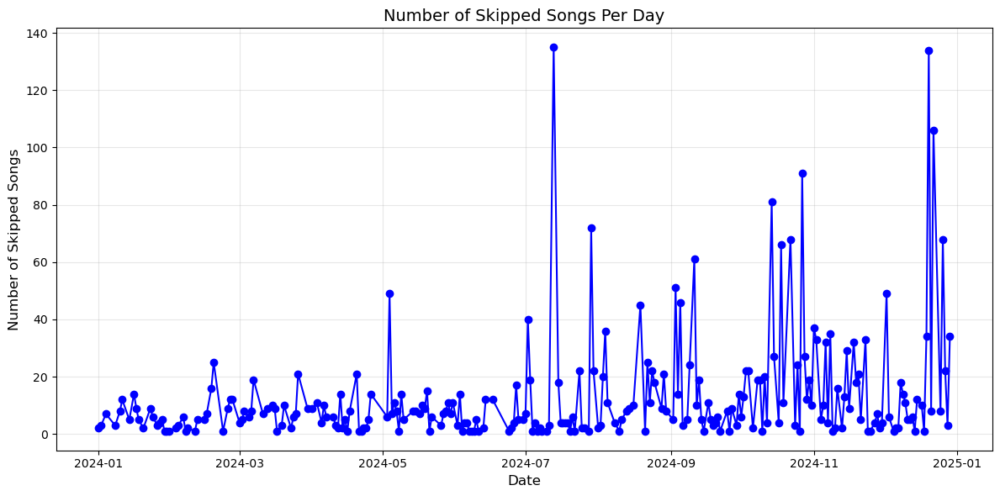

In [116]:
# Group by date and count the number of skipped songs per day
skipped_songs_per_day = skipped_data.groupby('date').size()

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(skipped_songs_per_day.index, skipped_songs_per_day.values, marker='o', linestyle='-', color='blue')

# Add titles and labels
plt.title("Number of Skipped Songs Per Day", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Number of Skipped Songs", fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()


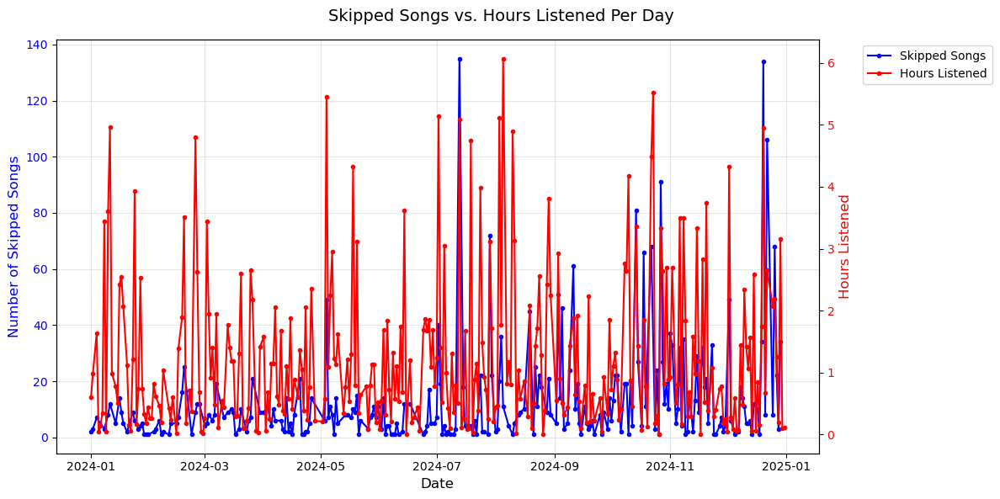

In [118]:
# Group by date and count the number of skipped songs per day
skipped_songs_per_day = skipped_data.groupby('date').size()

# Group by date and sum the hours listened per day
hours_listened_per_day = dfAn.groupby('date')['ms_played'].sum() / 3600000  # Convert ms to hours

# Create the plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot skipped songs on the first Y-axis
ax1.plot(skipped_songs_per_day.index, skipped_songs_per_day.values, marker='.', linestyle='-', color='blue', label='Skipped Songs')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Number of Skipped Songs', fontsize=12, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second Y-axis for hours listened
ax2 = ax1.twinx()
ax2.plot(hours_listened_per_day.index, hours_listened_per_day.values, marker='.', linestyle='-', color='red', label='Hours Listened')
ax2.set_ylabel('Hours Listened', fontsize=12, color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add titles and grid
fig.suptitle("Skipped Songs vs. Hours Listened Per Day", fontsize=14)
ax1.grid(alpha=0.3)

# Add legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', bbox_to_anchor=(1.05, 1))

plt.tight_layout()
plt.show()


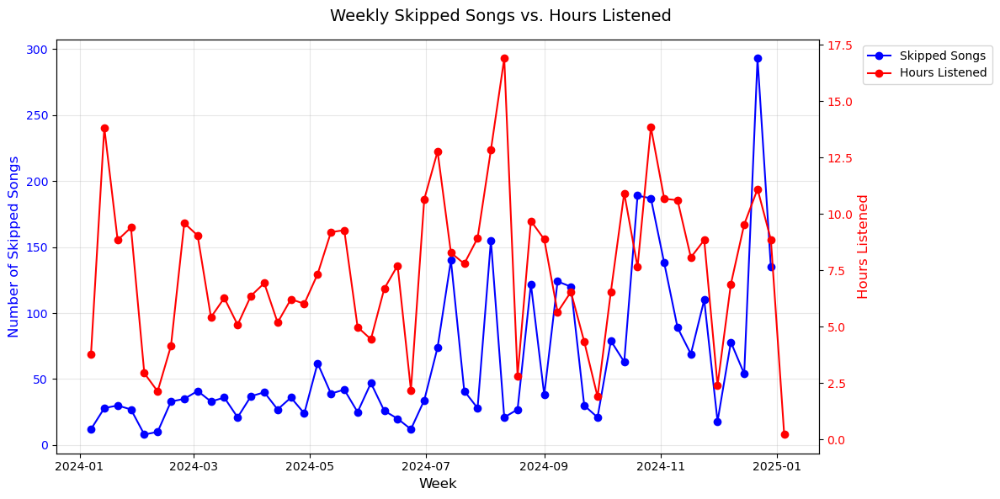

In [120]:
# Group by week and count the number of skipped songs
skipped_songs_per_week = skipped_data.groupby(pd.Grouper(key='date', freq='W')).size()

# Group by week and sum the hours listened
hours_listened_per_week = dfAn.groupby(pd.Grouper(key='date', freq='W'))['ms_played'].sum() / 3600000  # Convert ms to hours

# Create the plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot skipped songs on the first Y-axis
ax1.plot(skipped_songs_per_week.index, skipped_songs_per_week.values, marker='o', linestyle='-', color='blue', label='Skipped Songs')
ax1.set_xlabel('Week', fontsize=12)
ax1.set_ylabel('Number of Skipped Songs', fontsize=12, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second Y-axis for hours listened
ax2 = ax1.twinx()
ax2.plot(hours_listened_per_week.index, hours_listened_per_week.values, marker='o', linestyle='-', color='red', label='Hours Listened')
ax2.set_ylabel('Hours Listened', fontsize=12, color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add titles and grid
fig.suptitle("Weekly Skipped Songs vs. Hours Listened", fontsize=14)
ax1.grid(alpha=0.3)

# Add legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', bbox_to_anchor=(1.05, 1))

plt.tight_layout()
plt.show()


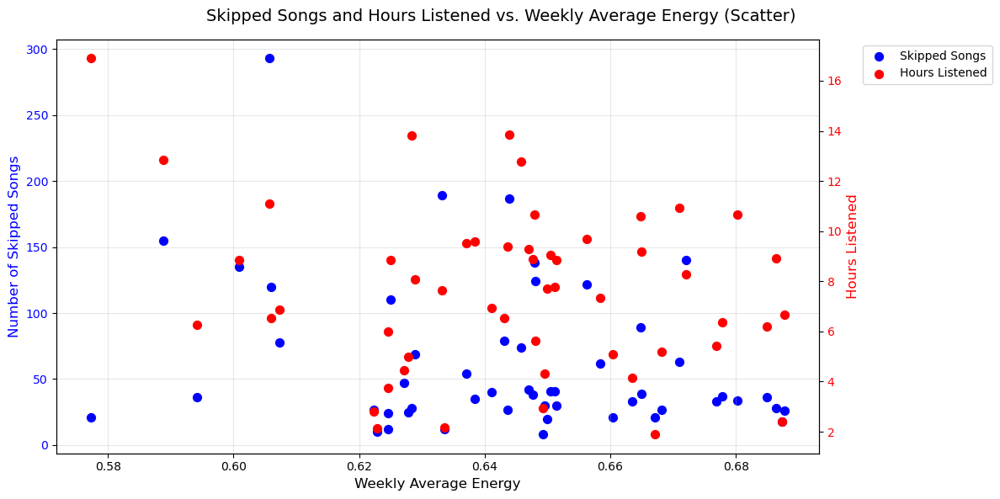

In [122]:
# Group by week and calculate the average energy
average_energy_per_week = dfAn.groupby(pd.Grouper(key='date', freq='W'))['energy'].mean()

# Group by week and count the number of skipped songs
skipped_songs_per_week = skipped_data.groupby(pd.Grouper(key='date', freq='W')).size()

# Group by week and sum the hours listened
hours_listened_per_week = dfAn.groupby(pd.Grouper(key='date', freq='W'))['ms_played'].sum() / 3600000  # Convert ms to hours

# Align all series to the same index
aligned_data = pd.DataFrame({
    'average_energy': average_energy_per_week,
    'skipped_songs': skipped_songs_per_week,
    'hours_listened': hours_listened_per_week
}).dropna()  # Drop rows with missing values to ensure alignment

# Create the plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Scatter plot for skipped songs on the first Y-axis
ax1.scatter(aligned_data['average_energy'], aligned_data['skipped_songs'], color='blue', label='Skipped Songs', s=50)
ax1.set_xlabel('Weekly Average Energy', fontsize=12)
ax1.set_ylabel('Number of Skipped Songs', fontsize=12, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second Y-axis for hours listened
ax2 = ax1.twinx()
ax2.scatter(aligned_data['average_energy'], aligned_data['hours_listened'], color='red', label='Hours Listened', s=50)
ax2.set_ylabel('Hours Listened', fontsize=12, color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add titles and grid
fig.suptitle("Skipped Songs and Hours Listened vs. Weekly Average Energy (Scatter)", fontsize=14)
ax1.grid(alpha=0.3)

# Add legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', bbox_to_anchor=(1.05, 1))

plt.tight_layout()
plt.show()


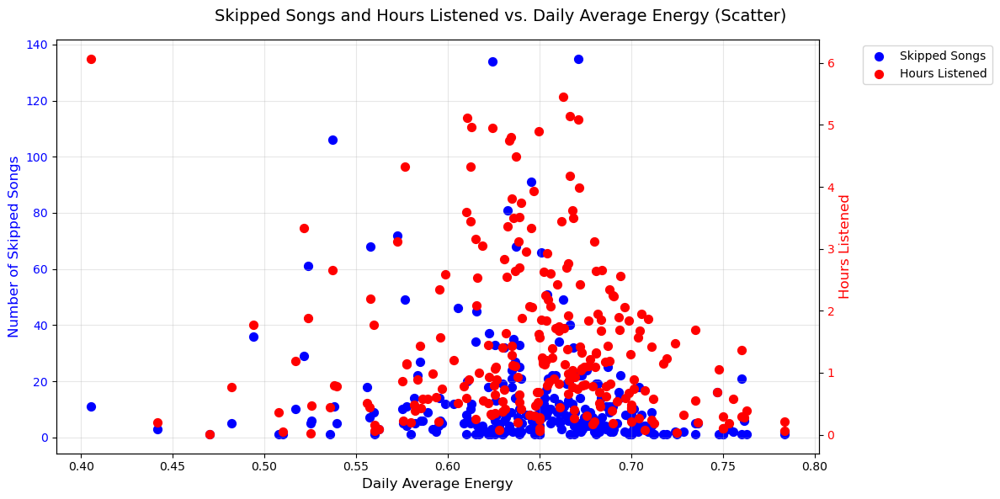

In [124]:
# Group by day and calculate the average energy
average_energy_per_day = dfAn.groupby('date')['energy'].mean()

# Group by day and count the number of skipped songs
skipped_songs_per_day = skipped_data.groupby('date').size()

# Group by day and sum the hours listened
hours_listened_per_day = dfAn.groupby('date')['ms_played'].sum() / 3600000  # Convert ms to hours

# Align all series to the same index
aligned_data_daily = pd.DataFrame({
    'average_energy': average_energy_per_day,
    'skipped_songs': skipped_songs_per_day,
    'hours_listened': hours_listened_per_day
}).dropna()  # Drop rows with missing values to ensure alignment

# Create the plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Scatter plot for skipped songs on the first Y-axis
ax1.scatter(aligned_data_daily['average_energy'], aligned_data_daily['skipped_songs'], color='blue', label='Skipped Songs', s=50)
ax1.set_xlabel('Daily Average Energy', fontsize=12)
ax1.set_ylabel('Number of Skipped Songs', fontsize=12, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second Y-axis for hours listened
ax2 = ax1.twinx()
ax2.scatter(aligned_data_daily['average_energy'], aligned_data_daily['hours_listened'], color='red', label='Hours Listened', s=50)
ax2.set_ylabel('Hours Listened', fontsize=12, color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add titles and grid
fig.suptitle("Skipped Songs and Hours Listened vs. Daily Average Energy (Scatter)", fontsize=14)
ax1.grid(alpha=0.3)

# Add legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', bbox_to_anchor=(1.05, 1))

plt.tight_layout()
plt.show()


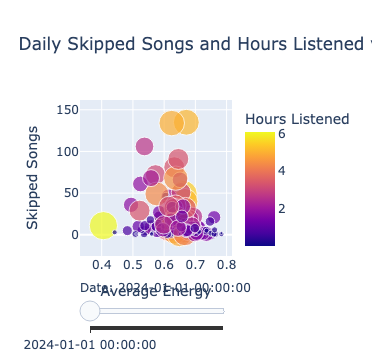

In [126]:
import plotly.express as px
import pandas as pd

# Prepare the data
aligned_data_daily['date'] = aligned_data_daily.index

# Create an interactive scatter plot with Plotly
fig = px.scatter(
    aligned_data_daily,
    x='average_energy',
    y='skipped_songs',
    size='hours_listened',
    color='hours_listened',
    hover_data=['date'],
    title="Daily Skipped Songs and Hours Listened vs. Average Energy",
    labels={'average_energy': 'Average Energy', 'skipped_songs': 'Skipped Songs', 'hours_listened': 'Hours Listened'}
)

# Add filter by date using Plotly's slider
fig.update_layout(
    xaxis_title='Average Energy',
    yaxis_title='Skipped Songs',
    sliders=[
        dict(
            active=0,
            currentvalue={"prefix": "Date: "},
            steps=[
                dict(label=str(date), method="restyle", args=[{"visible": [aligned_data_daily['date'] == date]}])
                for date in aligned_data_daily['date']
            ]
        )
    ]
)

# Display the interactive plot
fig.show()


/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/3983085991.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



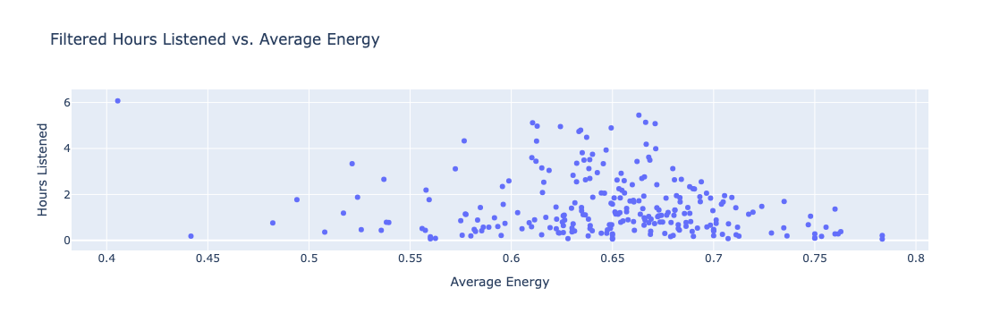

In [128]:
import plotly.express as px
import pandas as pd

# Filter the data where hours listened is greater than 0.05
filtered_data = aligned_data_daily[aligned_data_daily['hours_listened'] > 0.05]

# Ensure 'date' is in the filtered dataset
filtered_data['date'] = filtered_data.index

# Create an interactive scatter plot with Plotly
fig = px.scatter(
    filtered_data,
    x='average_energy',
    y='hours_listened',
    hover_data=['date'],
    title="Filtered Hours Listened vs. Average Energy",
    labels={'average_energy': 'Average Energy',  'hours_listened': 'Hours Listened'}
)

# Display the interactive plot
fig.update_layout(
    xaxis_title='Average Energy',
    yaxis_title='Hours Listened'
)

# Show the interactive plot
fig.show()


/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/1531960390.py:12: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/1531960390.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



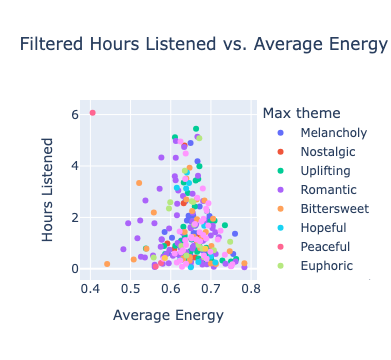

In [130]:
import plotly.express as px
import pandas as pd

# Filter the data where hours listened is greater than 0.05
filtered_data = aligned_data_daily[aligned_data_daily['hours_listened'] > 0.05]

# Ensure 'date' is in the filtered dataset


# Determine the max theme of the day
# Assuming dfAn has columns 'date', 'theme', and 'ms_played'
daily_max_theme = dfAn.groupby('date').apply(lambda x: x.loc[x['ms_played'].idxmax(), 'theme'])

# Add the max theme as a column to the filtered dataset
filtered_data['max_theme'] = filtered_data.index.map(daily_max_theme)

# Create an interactive scatter plot with Plotly
fig = px.scatter(
    filtered_data,
    x='average_energy',
    y='hours_listened',
    color='max_theme',  # Set the color based on the max theme
    hover_data=['date', 'max_theme'],
    title="Filtered Hours Listened vs. Average Energy with Max theme",
    labels={'average_energy': 'Average Energy', 'hours_listened': 'Hours Listened', 'max_theme': 'Max theme'}
)

# Display the interactive plot
fig.update_layout(
    xaxis_title='Average Energy',
    yaxis_title='Hours Listened'
)

# Show the interactive plot
fig.show()


In [ ]:
filtered_data

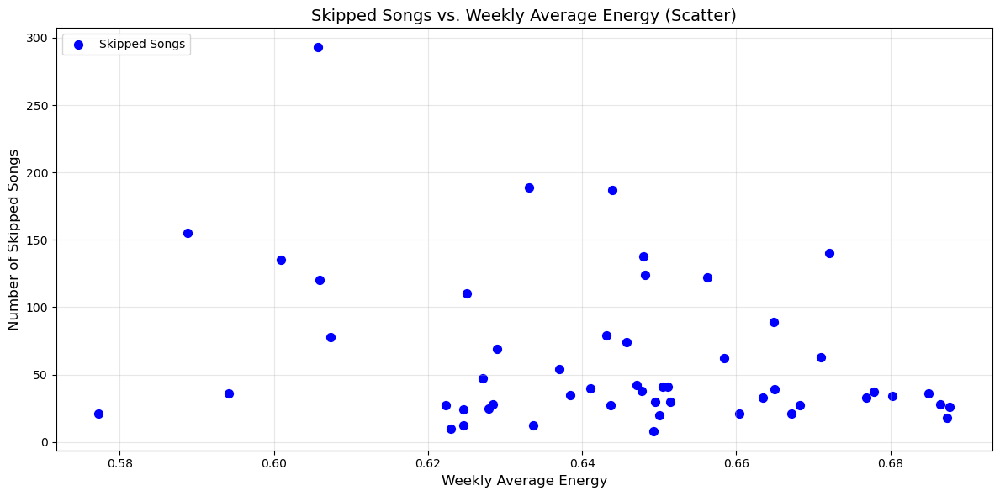

In [132]:
# Group by week and calculate the average energy
average_energy_per_week = dfAn.groupby(pd.Grouper(key='date', freq='W'))['energy'].mean()

# Group by week and count the number of skipped songs
skipped_songs_per_week = skipped_data.groupby(pd.Grouper(key='date', freq='W')).size()

# Align both series to the same index
aligned_data = pd.DataFrame({
    'average_energy': average_energy_per_week,
    'skipped_songs': skipped_songs_per_week
}).dropna()  # Drop rows with missing values to ensure alignment

# Create the plot
plt.figure(figsize=(12, 6))

# Scatter plot for skipped songs vs. average energy
plt.scatter(aligned_data['average_energy'], aligned_data['skipped_songs'], color='blue', s=50, label='Skipped Songs')

# Add titles and labels
plt.title("Skipped Songs vs. Weekly Average Energy (Scatter)", fontsize=14)
plt.xlabel("Weekly Average Energy", fontsize=12)
plt.ylabel("Number of Skipped Songs", fontsize=12)
plt.grid(alpha=0.3)
plt.legend(loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()


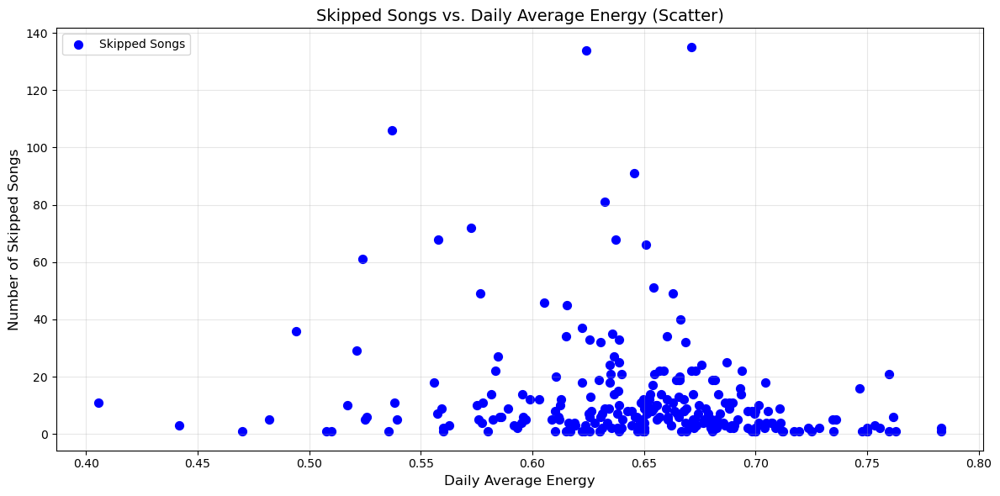

In [134]:
# Group by day and calculate the average energy
average_energy_per_day = dfAn.groupby('date')['energy'].mean()

# Group by day and count the number of skipped songs
skipped_songs_per_day = skipped_data.groupby('date').size()

# Align both series to the same index
aligned_data_daily = pd.DataFrame({
    'average_energy': average_energy_per_day,
    'skipped_songs': skipped_songs_per_day
}).dropna()  # Drop rows with missing values to ensure alignment

# Create the plot
plt.figure(figsize=(12, 6))

# Scatter plot for skipped songs vs. average energy
plt.scatter(aligned_data_daily['average_energy'], aligned_data_daily['skipped_songs'], color='blue', s=50, label='Skipped Songs')

# Add titles and labels
plt.title("Skipped Songs vs. Daily Average Energy (Scatter)", fontsize=14)
plt.xlabel("Daily Average Energy", fontsize=12)
plt.ylabel("Number of Skipped Songs", fontsize=12)
plt.grid(alpha=0.3)
plt.legend(loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()


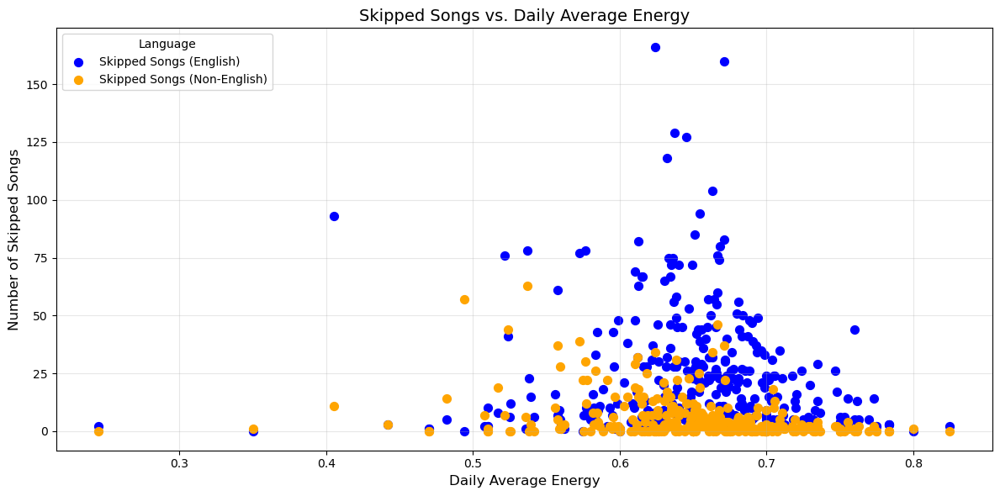

In [136]:
# Group by day and calculate the average energy
average_energy_per_day = dfAn.groupby('date')['energy'].mean()

# Group by day and count the number of skipped songs for English and non-English
skipped_songs_english = dfAn[dfAn['language'] == 'English'].groupby('date').size()
skipped_songs_non_english = dfAn[dfAn['language'] != 'English'].groupby('date').size()

# Align all series to the same index
aligned_data_daily = pd.DataFrame({
    'average_energy': average_energy_per_day,
    'skipped_songs_english': skipped_songs_english,
    'skipped_songs_non_english': skipped_songs_non_english
}).fillna(0)  # Fill missing values with 0 (e.g., no skips on a given day)

# Create the plot
plt.figure(figsize=(12, 6))

# Scatter plot for skipped English songs
plt.scatter(aligned_data_daily['average_energy'], aligned_data_daily['skipped_songs_english'], 
            color='blue', s=50, label='Skipped Songs (English)')

# Scatter plot for skipped non-English songs
plt.scatter(aligned_data_daily['average_energy'], aligned_data_daily['skipped_songs_non_english'], 
            color='orange', s=50, label='Skipped Songs (Non-English)')

# Add titles and labels
plt.title("Skipped Songs vs. Daily Average Energy", fontsize=14)
plt.xlabel("Daily Average Energy", fontsize=12)
plt.ylabel("Number of Skipped Songs", fontsize=12)
plt.legend(loc='upper left', title="Language")
plt.grid(alpha=0.3)

# Display the plot
plt.tight_layout()
plt.show()


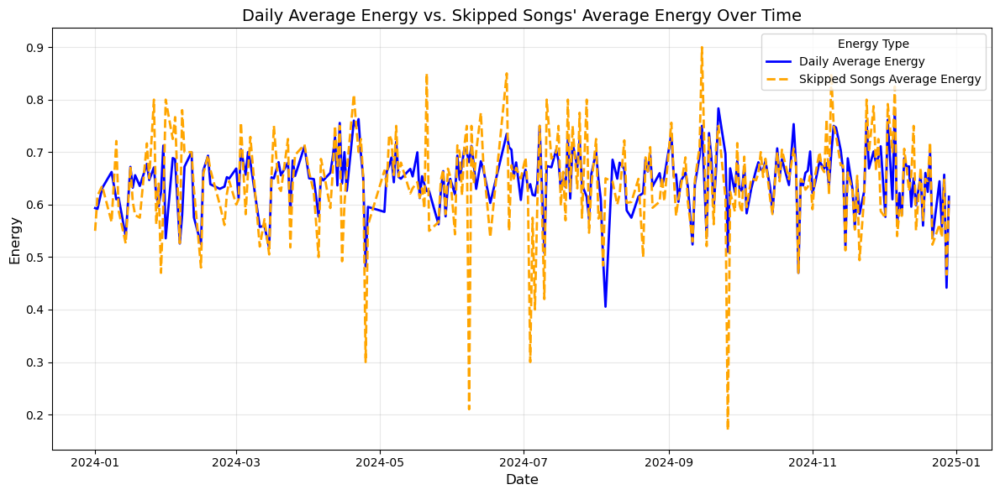

In [138]:
import matplotlib.pyplot as plt
import pandas as pd

# Calculate daily average energy (all songs)
daily_average_energy = dfAn.groupby('date')['energy'].mean()

# Calculate daily average energy for skipped songs only
skipped_songs_average_energy = dfAn[dfAn['skipped'] == 1].groupby('date')['energy'].mean()

# Combine both series into a single DataFrame
energy_data = pd.DataFrame({
    'daily_average_energy': daily_average_energy,
    'skipped_songs_average_energy': skipped_songs_average_energy
}).dropna()  # Drop days where one of the values is missing

# Plot the data
plt.figure(figsize=(12, 6))

# Plot daily average energy
plt.plot(energy_data.index, energy_data['daily_average_energy'], label='Daily Average Energy', color='blue', linewidth=2)

# Plot average energy of skipped songs
plt.plot(energy_data.index, energy_data['skipped_songs_average_energy'], label='Skipped Songs Average Energy', color='orange', linewidth=2, linestyle='--')

# Add titles and labels
plt.title("Daily Average Energy vs. Skipped Songs' Average Energy Over Time", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Energy", fontsize=12)
plt.legend(loc='upper right', fontsize=10, title="Energy Type")
plt.grid(alpha=0.3)

# Display the plot
plt.tight_layout()
plt.show()


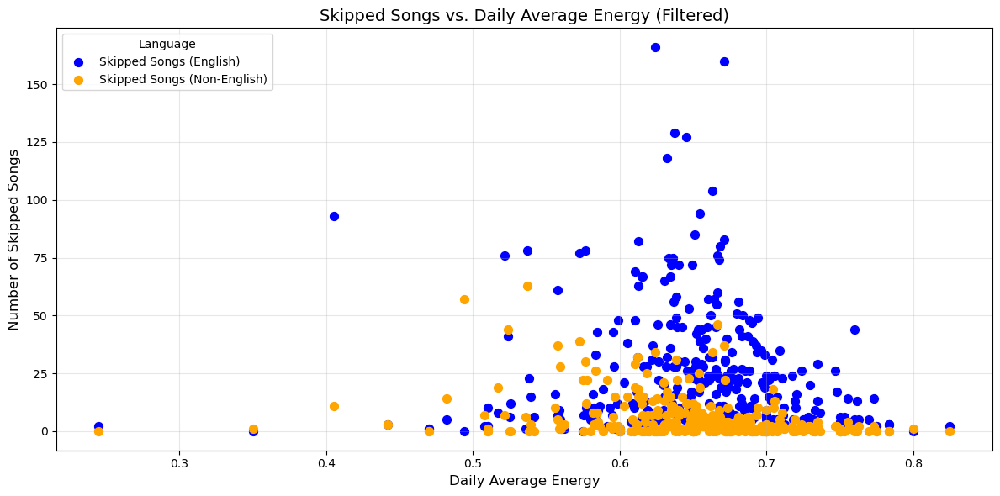

In [140]:
# Group by day and calculate the average energy
average_energy_per_day = dfAn.groupby('date')['energy'].mean()

# Group by day and count the number of skipped songs for English and non-English
skipped_songs_english = dfAn[dfAn['language'] == 'English'].groupby('date').size()
skipped_songs_non_english = dfAn[dfAn['language'] != 'English'].groupby('date').size()

# Align all series to the same index
aligned_data_daily = pd.DataFrame({
    'average_energy': average_energy_per_day,
    'skipped_songs_english': skipped_songs_english,
    'skipped_songs_non_english': skipped_songs_non_english
}).fillna(0)  # Fill missing values with 0

# Filter out rows where skipped songs are 0 for both English and non-English
aligned_data_daily = aligned_data_daily[
    (aligned_data_daily['skipped_songs_english'] > 0) | 
    (aligned_data_daily['skipped_songs_non_english'] > 0)
]

# Create the plot
plt.figure(figsize=(12, 6))

# Scatter plot for skipped English songs
plt.scatter(aligned_data_daily['average_energy'], aligned_data_daily['skipped_songs_english'], 
            color='blue', s=50, label='Skipped Songs (English)')

# Scatter plot for skipped non-English songs
plt.scatter(aligned_data_daily['average_energy'], aligned_data_daily['skipped_songs_non_english'], 
            color='orange', s=50, label='Skipped Songs (Non-English)')

# Add titles and labels
plt.title("Skipped Songs vs. Daily Average Energy (Filtered)", fontsize=14)
plt.xlabel("Daily Average Energy", fontsize=12)
plt.ylabel("Number of Skipped Songs", fontsize=12)
plt.legend(loc='upper left', title="Language")
plt.grid(alpha=0.3)

# Display the plot
plt.tight_layout()
plt.show()


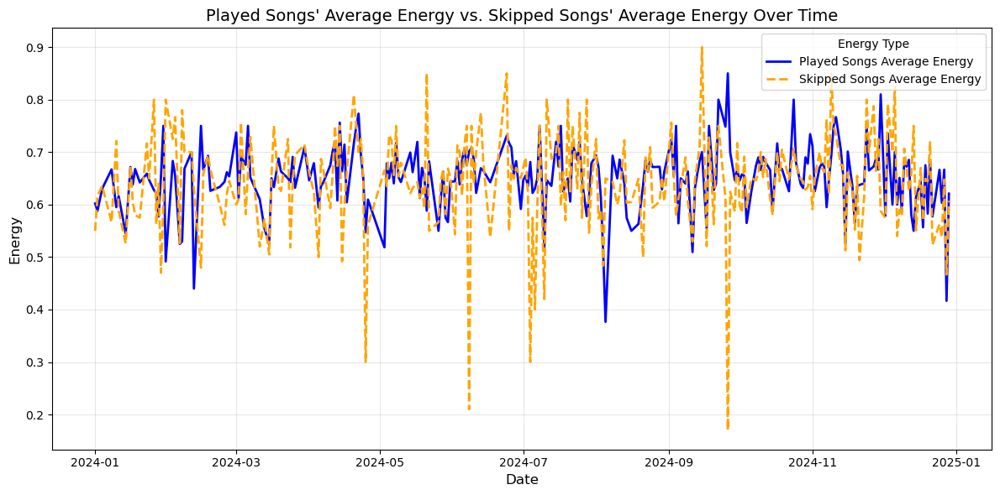

In [142]:
# Calculate daily average energy for played songs (songs not skipped)
played_songs_average_energy = dfAn[dfAn['skipped'] == 0].groupby('date')['energy'].mean()

# Calculate daily average energy for skipped songs only
skipped_songs_average_energy = dfAn[dfAn['skipped'] == 1].groupby('date')['energy'].mean()

# Combine both series into a single DataFrame
energy_data = pd.DataFrame({
    'played_songs_average_energy': played_songs_average_energy,
    'skipped_songs_average_energy': skipped_songs_average_energy
}).dropna()  # Drop days where one of the values is missing

# Plot the data
plt.figure(figsize=(12, 6))

# Plot average energy of played songs
plt.plot(energy_data.index, energy_data['played_songs_average_energy'], label='Played Songs Average Energy', color='blue', linewidth=2)

# Plot average energy of skipped songs
plt.plot(energy_data.index, energy_data['skipped_songs_average_energy'], label='Skipped Songs Average Energy', color='orange', linewidth=2, linestyle='--')

# Add titles and labels
plt.title("Played Songs' Average Energy vs. Skipped Songs' Average Energy Over Time", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Energy", fontsize=12)
plt.legend(loc='upper right', fontsize=10, title="Energy Type")
plt.grid(alpha=0.3)

# Display the plot
plt.tight_layout()
plt.show()


In [144]:
# Calculate the difference between skipped songs' average energy and daily average energy
energy_data['energy_difference'] = energy_data['skipped_songs_average_energy'] - energy_data['played_songs_average_energy']

# Check the mean of the differences
mean_difference = energy_data['energy_difference'].median()
print(f"Median Difference: {mean_difference:.2f}")

# Determine if skipped songs' energy is generally higher or lower
if mean_difference > 0:
    print("Skipped songs' energy levels are generally HIGHER than the daily average energy.")
elif mean_difference < 0:
    print("Skipped songs' energy levels are generally LOWER than the daily average energy.")
else:
    print("Skipped songs' energy levels are EQUAL to the daily average energy.")


Median Difference: -0.00
Skipped songs' energy levels are generally LOWER than the daily average energy.


In [ ]:
energy_data

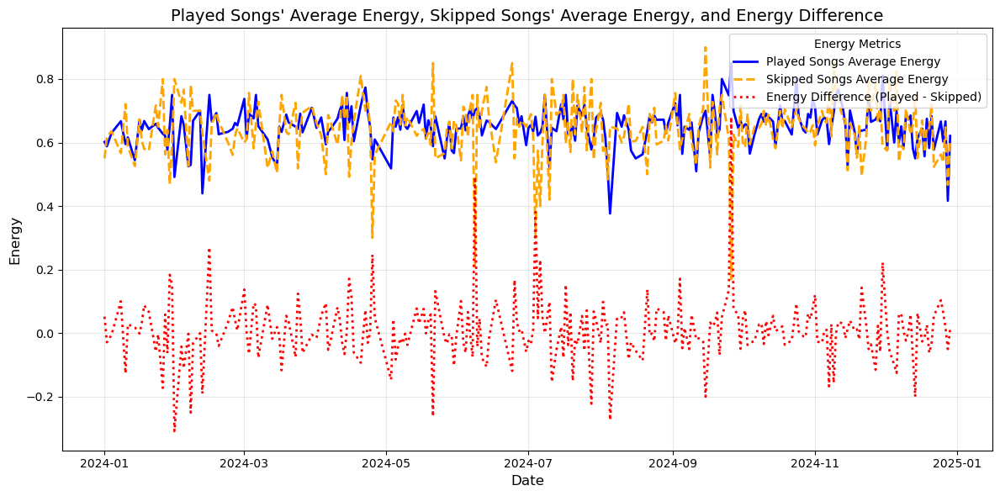

In [146]:
import matplotlib.pyplot as plt
import pandas as pd

# Calculate daily average energy for played songs (not skipped)
played_songs_average_energy = dfAn[dfAn['skipped'] == 0].groupby('date')['energy'].mean()

# Calculate daily average energy for skipped songs
skipped_songs_average_energy = dfAn[dfAn['skipped'] == 1].groupby('date')['energy'].mean()

# Combine both series into a single DataFrame
energy_data = pd.DataFrame({
    'played_songs_average_energy': played_songs_average_energy,
    'skipped_songs_average_energy': skipped_songs_average_energy
}).dropna()  # Drop rows with missing values

# Calculate the energy difference
energy_data['energy_difference'] = energy_data['played_songs_average_energy'] - energy_data['skipped_songs_average_energy']

# Plot the data
plt.figure(figsize=(12, 6))

# Plot average energy of played songs
plt.plot(energy_data.index, energy_data['played_songs_average_energy'], label='Played Songs Average Energy', color='blue', linewidth=2)

# Plot average energy of skipped songs
plt.plot(energy_data.index, energy_data['skipped_songs_average_energy'], label='Skipped Songs Average Energy', color='orange', linewidth=2, linestyle='--')

# Plot energy difference
plt.plot(energy_data.index, energy_data['energy_difference'], label='Energy Difference (Played - Skipped)', color='red', linewidth=2, linestyle=':')

# Add titles and labels
plt.title("Played Songs' Average Energy, Skipped Songs' Average Energy, and Energy Difference", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Energy", fontsize=12)
plt.legend(loc='upper right', fontsize=10, title="Energy Metrics")
plt.grid(alpha=0.3)

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
energy_data

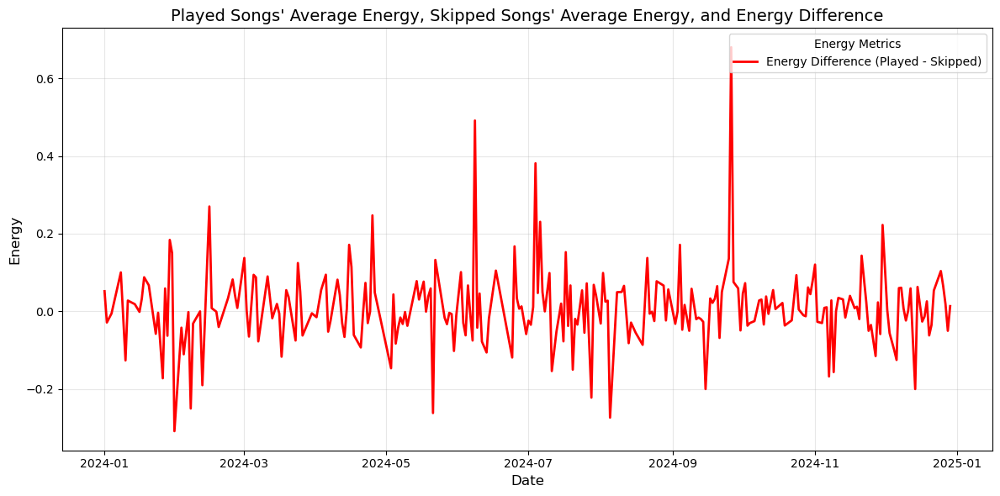

In [148]:
import matplotlib.pyplot as plt
import pandas as pd

plt.figure(figsize=(12, 6))

# Plot average energy of played songs
#plt.plot(energy_data.index, energy_data['played_songs_average_energy'], label='Played Songs Average Energy', color='blue', linewidth=2)


# Plot average energy of skipped songs
#plt.plot(energy_data.index, energy_data['skipped_songs_average_energy'], label='Skipped Songs Average Energy', color='orange', linewidth=2, linestyle='--')

# Plot energy difference
plt.plot(energy_data.index, energy_data['energy_difference'], label='Energy Difference (Played - Skipped)', color='red', linewidth=2, linestyle='-')

# Add titles and labels
plt.title("Played Songs' Average Energy, Skipped Songs' Average Energy, and Energy Difference", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Energy", fontsize=12)
plt.legend(loc='upper right', fontsize=10, title="Energy Metrics")
plt.grid(alpha=0.3)

# Display the plot
plt.tight_layout()
plt.show()


In [150]:
from scipy.stats import ttest_1samp
import numpy as np

# Calculate the average energy difference
average_energy_difference = energy_data['energy_difference'].mean()
print(f"Average Energy Difference: {average_energy_difference:.4f}")

# Perform a one-sample t-test to check if the mean > 0.01
t_stat, p_value = ttest_1samp(energy_data['energy_difference'], 0.01)

# Since we are testing if mean > 0.01, adjust the p-value for a one-tailed test
one_tailed_p = p_value / 2 if t_stat > 0 else 1

print(f"T-Statistic: {t_stat:.4f}")
print(f"P-Value (one-tailed): {one_tailed_p:.4f}")

# Interpret the result
if one_tailed_p < 0.05:
    print("The mean energy difference is significantly greater than 0.01.")
else:
    print("The mean energy difference is NOT significantly greater than 0.01.")


Average Energy Difference: 0.0090
T-Statistic: -0.1522
P-Value (one-tailed): 1.0000
The mean energy difference is NOT significantly greater than 0.01.


In [152]:
# Calculate the mode of the energy difference
energy_difference_mode = energy_data['energy_difference'].mode()

# Print the mode
if len(energy_difference_mode) > 0:
    print(f"Mode of Energy Difference: {energy_difference_mode.iloc[0]:.4f}")
else:
    print("No mode found (all values are unique).")


Mode of Energy Difference: 0.0500


In [154]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Group data by date to calculate daily average energy
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)  # Binary flag for English
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')  # Daily average energy

# Add the daily average energy to the DataFrame
dfAn['daily_avg_energy'] = average_energy_per_day

# Prepare the dataset
features = ['is_english', 'daily_avg_energy', 'energy', 'theme']  # Include necessary features
dfAn = dfAn.dropna(subset=features + ['skipped'])  # Drop rows with missing values

# One-hot encode the 'theme' column
df_encoded = pd.get_dummies(dfAn, columns=['theme'], drop_first=True)

# Define features and target
X = df_encoded[['is_english', 'daily_avg_energy', 'energy'] + [col for col in df_encoded if col.startswith('theme_')]]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=42)

model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.71      0.74      0.73      1868
        True       0.48      0.45      0.47      1011

    accuracy                           0.64      2879
   macro avg       0.60      0.60      0.60      2879
weighted avg       0.63      0.64      0.64      2879

Accuracy: 0.64
Feature: is_english, Importance: 0.01
Feature: daily_avg_energy, Importance: 0.75
Feature: energy, Importance: 0.18
Feature: theme_Empowered, Importance: 0.01
Feature: theme_Euphoric, Importance: 0.01
Feature: theme_Hopeful, Importance: 0.00
Feature: theme_Melancholy, Importance: 0.01
Feature: theme_Nostalgic, Importance: 0.00
Feature: theme_Peaceful, Importance: 0.00
Feature: theme_Romantic, Importance: 0.01
Feature: theme_Sentimental, Importance: 0.00
Feature: theme_Uplifting, Importance: 0.01


In [156]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Group data by date to calculate daily average energy
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)  # Binary flag for English
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')  # Daily average energy

# Add the daily average energy to the DataFrame
dfAn['daily_avg_energy'] = average_energy_per_day

# Ensure 'time' is in proper datetime format
dfAn['time'] = pd.to_datetime(dfAn['date'].astype(str) + ' ' + dfAn['time'].astype(str))

# Extract hour of the day
dfAn['hour'] = dfAn['time'].dt.hour

# Optional: Add part_of_day
def get_part_of_day(hour):
    if 5 <= hour < 12:
        return 'morning'
    elif 12 <= hour < 17:
        return 'afternoon'
    elif 17 <= hour < 21:
        return 'evening'
    else:
        return 'night'

dfAn['part_of_day'] = dfAn['hour'].apply(get_part_of_day)

# The rest of your existing code follows...


# One-hot encode the 'theme' and 'part_of_day' columns
df_encoded = pd.get_dummies(dfAn, columns=['theme', 'part_of_day'], drop_first=True)

# Prepare the dataset
features = ['is_english', 'daily_avg_energy', 'energy', 'hour'] + [col for col in df_encoded if col.startswith('theme_') or col.startswith('part_of_day_')]
df_encoded = df_encoded.dropna(subset=features + ['skipped'])  # Drop rows with missing values

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.72      0.81      0.76      1868
        True       0.54      0.42      0.47      1011

    accuracy                           0.67      2879
   macro avg       0.63      0.61      0.62      2879
weighted avg       0.66      0.67      0.66      2879

Accuracy: 0.67
Feature: is_english, Importance: 0.02
Feature: daily_avg_energy, Importance: 0.48
Feature: energy, Importance: 0.21
Feature: hour, Importance: 0.17
Feature: theme_Empowered, Importance: 0.02
Feature: theme_Euphoric, Importance: 0.01
Feature: theme_Hopeful, Importance: 0.01
Feature: theme_Melancholy, Importance: 0.01
Feature: theme_Nostalgic, Importance: 0.01
Feature: theme_Peaceful, Importance: 0.00
Feature: theme_Romantic, Importance: 0.02
Feature: theme_Sentimental, Importance: 0.01
Feature: theme_Uplifting, Importance: 0.01
Feature: part_of_day_evening, Importance: 0.01
Feature: part_of_day_morning, Importance: 0.01
Feature:

In [158]:
from sklearn.model_selection import train_test_split

dfAn['part_of_day'] = dfAn['hour'].apply(get_part_of_day)

# One-hot encode the 'theme' and 'part_of_day' columns
df_encoded = pd.get_dummies(dfAn, columns=['theme', 'part_of_day'], drop_first=True)

# Prepare the dataset
features = ['daily_avg_energy', 'energy', 'hour'] + [col for col in df_encoded if col.startswith('theme_') or col.startswith('part_of_day_')]
df_encoded = df_encoded.dropna(subset=features + ['skipped'])  # Drop rows with missing values

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.72      0.80      0.76      1868
        True       0.54      0.43      0.48      1011

    accuracy                           0.67      2879
   macro avg       0.63      0.62      0.62      2879
weighted avg       0.66      0.67      0.66      2879

Accuracy: 0.67
Feature: daily_avg_energy, Importance: 0.53
Feature: energy, Importance: 0.22
Feature: hour, Importance: 0.15
Feature: theme_Empowered, Importance: 0.01
Feature: theme_Euphoric, Importance: 0.01
Feature: theme_Hopeful, Importance: 0.01
Feature: theme_Melancholy, Importance: 0.01
Feature: theme_Nostalgic, Importance: 0.01
Feature: theme_Peaceful, Importance: 0.00
Feature: theme_Romantic, Importance: 0.01
Feature: theme_Sentimental, Importance: 0.01
Feature: theme_Uplifting, Importance: 0.01
Feature: part_of_day_evening, Importance: 0.01
Feature: part_of_day_morning, Importance: 0.01
Feature: part_of_day_night, Importance: 0.01


In [160]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Group data by date to calculate daily average energy
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)  # Binary flag for English
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')  # Daily average energy

# Add the daily average energy to the DataFrame
dfAn['daily_avg_energy'] = average_energy_per_day

# Ensure 'time' is in proper datetime format
#dfAn['time'] = pd.to_datetime(dfAn['date'].astype(str) + ' ' + dfAn['time'].astype(str))

# Extract hour of the day
dfAn['hour'] = dfAn['time'].dt.hour

# Optional: Add part_of_day
def get_part_of_day(hour):
    if 5 <= hour < 12:
        return 'morning'
    elif 12 <= hour < 17:
        return 'afternoon'
    elif 17 <= hour < 21:
        return 'evening'
    else:
        return 'night'

dfAn['part_of_day'] = dfAn['hour'].apply(get_part_of_day)

# One-hot encode the 'theme' and 'part_of_day' columns
df_encoded = pd.get_dummies(dfAn, columns=['theme', 'part_of_day'], drop_first=True)

# Prepare the dataset
features = ['is_english', 'daily_avg_energy', 'hour'] + [col for col in df_encoded if col.startswith('theme_') or col.startswith('part_of_day_')]
df_encoded = df_encoded.dropna(subset=features + ['skipped'])  # Drop rows with missing values

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=4276)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.77      0.76      0.76      1868
        True       0.57      0.58      0.57      1011

    accuracy                           0.70      2879
   macro avg       0.67      0.67      0.67      2879
weighted avg       0.70      0.70      0.70      2879

Accuracy: 0.70
Feature: is_english, Importance: 0.02
Feature: daily_avg_energy, Importance: 0.71
Feature: hour, Importance: 0.17
Feature: theme_Empowered, Importance: 0.01
Feature: theme_Euphoric, Importance: 0.01
Feature: theme_Hopeful, Importance: 0.01
Feature: theme_Melancholy, Importance: 0.01
Feature: theme_Nostalgic, Importance: 0.01
Feature: theme_Peaceful, Importance: 0.00
Feature: theme_Romantic, Importance: 0.01
Feature: theme_Sentimental, Importance: 0.01
Feature: theme_Uplifting, Importance: 0.01
Feature: part_of_day_evening, Importance: 0.01
Feature: part_of_day_morning, Importance: 0.01
Feature: part_of_day_night, Importance: 0.

In [162]:
# Find misclassified samples
misclassified = X_test[(y_test != y_pred)]

# Analyze misclassified samples
print("Misclassified Sample Distribution:")
print(misclassified.describe())


Misclassified Sample Distribution:
       is_english  daily_avg_energy        hour
count  875.000000        875.000000  875.000000
mean     0.814857          0.640047   12.742857
std      0.388636          0.049516    8.281181
min      0.000000          0.405481    0.000000
25%      1.000000          0.622105    4.000000
50%      1.000000          0.646053   16.000000
75%      1.000000          0.667922   20.000000
max      1.000000          0.800000   23.000000


In [164]:
english_misclassified = misclassified[misclassified['is_english'] == 1]
non_english_misclassified = misclassified[misclassified['is_english'] == 0]

print("English Misclassification Summary:")

print(english_misclassified.describe())

print("Non-English Misclassification Summary:")
print(non_english_misclassified.describe())


English Misclassification Summary:
       is_english  daily_avg_energy        hour
count       713.0        713.000000  713.000000
mean          1.0          0.642681   12.826087
std           0.0          0.047509    8.296848
min           1.0          0.405481    0.000000
25%           1.0          0.624270    4.000000
50%           1.0          0.649000   16.000000
75%           1.0          0.669091   20.000000
max           1.0          0.761538   23.000000
Non-English Misclassification Summary:
       is_english  daily_avg_energy        hour
count       162.0        162.000000  162.000000
mean          0.0          0.628453   12.376543
std           0.0          0.056233    8.227371
min           0.0          0.405481    0.000000
25%           0.0          0.610239    4.000000
50%           0.0          0.638333   15.000000
75%           0.0          0.662815   20.000000
max           0.0          0.800000   23.000000


In [ ]:
dfAn['part_of_day']

In [166]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# One-hot encode the 'theme', 'part_of_day', and 'genre' columns
df_encoded = pd.get_dummies(dfAn, columns=['theme', 'part_of_day', 'genre'], drop_first=True)

# Scale 'ms_played'
scaler = MinMaxScaler()
df_encoded['ms_played'] = scaler.fit_transform(df_encoded[['ms_played']])

# Prepare the dataset
features = (
    ['is_english', 'daily_avg_energy', 'hour', 'ms_played'] + 
    [col for col in df_encoded if col.startswith('theme_') or col.startswith('part_of_day_') or col.startswith('genre_')]
)

# Drop rows with missing values in the required features and target
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=4276)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.92      0.96      0.94      1868
        True       0.91      0.85      0.88      1011

    accuracy                           0.92      2879
   macro avg       0.92      0.90      0.91      2879
weighted avg       0.92      0.92      0.92      2879

Accuracy: 0.92
Feature: is_english, Importance: 0.01
Feature: daily_avg_energy, Importance: 0.08
Feature: hour, Importance: 0.04
Feature: ms_played, Importance: 0.72
Feature: theme_Empowered, Importance: 0.00
Feature: theme_Euphoric, Importance: 0.00
Feature: theme_Hopeful, Importance: 0.00
Feature: theme_Melancholy, Importance: 0.00
Feature: theme_Nostalgic, Importance: 0.00
Feature: theme_Peaceful, Importance: 0.00
Feature: theme_Romantic, Importance: 0.01
Feature: theme_Sentimental, Importance: 0.00
Feature: theme_Uplifting, Importance: 0.00
Feature: part_of_day_evening, Importance: 0.01
Feature: part_of_day_morning, Importance: 0.01
Featu

In [170]:
#92% accuracy is flawed as ms_played is directly linked to skipping the song.
#taking out the ms_played
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')
dfAn['daily_avg_energy'] = average_energy_per_day

# One-hot encode the 'genre' column
df_encoded = pd.get_dummies(dfAn, columns=['genre'], drop_first=True)

# Select the features
features = ['is_english', 'daily_avg_energy', 'hour'] + [col for col in df_encoded if col.startswith('genre_')]

# Drop rows with missing values in the selected features and target
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=4276)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")



Classification Report:
              precision    recall  f1-score   support

       False       0.73      0.80      0.76      1868
        True       0.55      0.47      0.51      1011

    accuracy                           0.68      2879
   macro avg       0.64      0.63      0.64      2879
weighted avg       0.67      0.68      0.67      2879

Accuracy: 0.68
Feature: is_english, Importance: 0.01
Feature: daily_avg_energy, Importance: 0.46
Feature: hour, Importance: 0.23
Feature: genre_Acoustic Electronic, Importance: 0.00
Feature: genre_Acoustic Pop, Importance: 0.00
Feature: genre_Acoustic Rock, Importance: 0.00
Feature: genre_Afro-pop, Importance: 0.00
Feature: genre_Afrobeats, Importance: 0.00
Feature: genre_Alternative Hip Hop, Importance: 0.00
Feature: genre_Alternative Metal, Importance: 0.00
Feature: genre_Alternative Pop, Importance: 0.00
Feature: genre_Alternative R&B, Importance: 0.00
Feature: genre_Alternative Rock, Importance: 0.00
Feature: genre_Ambient, Importance: 0.

In [172]:
#the genre has no effect
#taking out genre as a feature and replacing it with platform
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')
dfAn['daily_avg_energy'] = average_energy_per_day

# One-hot encode the 'platform' column
df_encoded = pd.get_dummies(dfAn, columns=['platform'], drop_first=True)

# Select the features
features = ['is_english', 'daily_avg_energy', 'hour']

# Drop rows with missing values in the selected features and target
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=4276)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.82      0.74      0.78      1868
        True       0.59      0.70      0.64      1011

    accuracy                           0.73      2879
   macro avg       0.71      0.72      0.71      2879
weighted avg       0.74      0.73      0.73      2879

Accuracy: 0.73
Feature: is_english, Importance: 0.02
Feature: daily_avg_energy, Importance: 0.78
Feature: hour, Importance: 0.20


In [174]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')
dfAn['daily_avg_energy'] = average_energy_per_day

# One-hot encode the 'platform' and 'part_of_day' columns
df_encoded = pd.get_dummies(dfAn, columns=['platform', 'part_of_day'], drop_first=True)

# Select the features, including columns starting with 'part_of_day_'
features = ['is_english', 'daily_avg_energy', 'hour'] + \
           [col for col in df_encoded.columns if col.startswith('part_of_day_')]

# Drop rows with missing values in the selected features and target
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=4276)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.82      0.74      0.78      1868
        True       0.59      0.70      0.64      1011

    accuracy                           0.73      2879
   macro avg       0.71      0.72      0.71      2879
weighted avg       0.74      0.73      0.73      2879

Accuracy: 0.73
Feature: is_english, Importance: 0.02
Feature: daily_avg_energy, Importance: 0.81
Feature: hour, Importance: 0.14
Feature: part_of_day_evening, Importance: 0.01
Feature: part_of_day_morning, Importance: 0.01
Feature: part_of_day_night, Importance: 0.01


In [176]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')
dfAn['daily_avg_energy'] = average_energy_per_day

# Extract the hour from the 'time' column
dfAn['hour'] = dfAn['time'].dt.hour

# Define a function to categorize time into parts of the day
def get_part_of_day(hour):
    if 5 <= hour < 12:
        return 'morning'
    elif 12 <= hour < 17:
        return 'afternoon'
    elif 17 <= hour < 21:
        return 'evening'
    else:
        return 'night'

# Create the 'time_of_day' feature
dfAn['time_of_day'] = dfAn['hour'].apply(get_part_of_day)

# One-hot encode the 'platform' and 'time_of_day' columns
df_encoded = pd.get_dummies(dfAn, columns=['platform', 'time_of_day'], drop_first=True)

# Select the features
features = ['is_english', 'daily_avg_energy'] + \
           [col for col in df_encoded if col.startswith('platform_') or col.startswith('time_of_day_')]

# Drop rows with missing values in the selected features and target
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=4276)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.82      0.71      0.76      1868
        True       0.57      0.71      0.63      1011

    accuracy                           0.71      2879
   macro avg       0.69      0.71      0.69      2879
weighted avg       0.73      0.71      0.71      2879

Accuracy: 0.71
Feature: is_english, Importance: 0.03
Feature: daily_avg_energy, Importance: 0.84
Feature: platform_ios, Importance: 0.05
Feature: platform_not_applicable, Importance: 0.01
Feature: platform_osx, Importance: 0.03
Feature: time_of_day_evening, Importance: 0.01
Feature: time_of_day_morning, Importance: 0.01
Feature: time_of_day_night, Importance: 0.01


In [178]:
#the genre has no effect
#taking out genre as a feature and replacing it with platform
#best RF model
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')
dfAn['daily_avg_energy'] = average_energy_per_day

# One-hot encode the 'platform' column
df_encoded = pd.get_dummies(dfAn, columns=['platform'], drop_first=True)

# Select the features
features = ['is_english', 'daily_avg_energy', 'hour'] + [col for col in df_encoded if col.startswith('platform_')]

# Drop rows with missing values in the selected features and target
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=4276)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.82      0.75      0.78      1868
        True       0.60      0.70      0.64      1011

    accuracy                           0.73      2879
   macro avg       0.71      0.72      0.71      2879
weighted avg       0.74      0.73      0.73      2879

Accuracy: 0.73
Feature: is_english, Importance: 0.03
Feature: daily_avg_energy, Importance: 0.66
Feature: hour, Importance: 0.24
Feature: platform_ios, Importance: 0.04
Feature: platform_not_applicable, Importance: 0.01
Feature: platform_osx, Importance: 0.02


In [180]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb
import pandas as pd

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train an XGBoost Classifier
model = xgb.XGBClassifier(
    objective='binary:logistic', 
    eval_metric='logloss', 
    use_label_encoder=False, 
    scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1],  # Handle class imbalance
    random_state=4276
)

model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")

Classification Report:
              precision    recall  f1-score   support

       False       0.83      0.72      0.77      1868
        True       0.58      0.72      0.64      1011

    accuracy                           0.72      2879
   macro avg       0.70      0.72      0.71      2879
weighted avg       0.74      0.72      0.73      2879

Accuracy: 0.72
Feature: is_english, Importance: 0.11
Feature: daily_avg_energy, Importance: 0.15
Feature: hour, Importance: 0.09
Feature: platform_ios, Importance: 0.45
Feature: platform_not_applicable, Importance: 0.10
Feature: platform_osx, Importance: 0.10


/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/2770745625.py:18: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[19:31:33] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [182]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb
import pandas as pd

features = ['is_english', 'daily_avg_energy', 'hour']
# Define features and target

X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train an XGBoost Classifier
model = xgb.XGBClassifier(
    objective='binary:logistic', 
    eval_metric='logloss', 
    use_label_encoder=False, 
    scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1],  # Handle class imbalance
    random_state=4276
)

model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")

Classification Report:
              precision    recall  f1-score   support

       False       0.82      0.72      0.77      1868
        True       0.58      0.71      0.64      1011

    accuracy                           0.72      2879
   macro avg       0.70      0.72      0.70      2879
weighted avg       0.74      0.72      0.72      2879

Accuracy: 0.72
Feature: is_english, Importance: 0.28
Feature: daily_avg_energy, Importance: 0.43
Feature: hour, Importance: 0.29


/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/2464491622.py:20: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[19:31:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [184]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
dfAn['daily_avg_energy'] = dfAn.groupby('date')['energy'].transform('mean')

# Ensure 'hour' is an integer
dfAn['hour'] = dfAn['hour'].astype(int)

# Convert 'hour' into cyclic features
dfAn['sin_hour'] = np.sin(2 * np.pi * dfAn['hour'] / 24)
dfAn['cos_hour'] = np.cos(2 * np.pi * dfAn['hour'] / 24)

# One-hot encode 'platform' column
df_encoded = pd.get_dummies(dfAn, columns=['platform'], drop_first=True)

# Define the features
features = ['is_english', 'daily_avg_energy', 'sin_hour']

# Drop 'hour' as it's now represented by sin/cos transformations
df_encoded = df_encoded.drop(columns=['hour'], errors='ignore')

# Drop rows with missing values
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train an XGBoost Classifier
model = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    use_label_encoder=False,
    scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1],  # Handle class imbalance
    random_state=4276
)

model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.82      0.73      0.77      1868
        True       0.58      0.71      0.64      1011

    accuracy                           0.72      2879
   macro avg       0.70      0.72      0.71      2879
weighted avg       0.74      0.72      0.73      2879

Accuracy: 0.72
Feature: is_english, Importance: 0.28
Feature: daily_avg_energy, Importance: 0.43
Feature: sin_hour, Importance: 0.29


/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/2121373321.py:44: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[19:31:40] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [186]:
#the genre has no effect
#taking out genre as a feature and replacing it with platform
#best RF model
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
average_energy_per_day = dfAn.groupby('date')['energy'].transform('mean')
dfAn['daily_avg_energy'] = average_energy_per_day

# Convert 'hour' into cyclic features
dfAn['sin_hour'] = np.sin(2 * np.pi * dfAn['hour'] / 24)

# One-hot encode the 'platform' column
df_encoded = pd.get_dummies(dfAn, columns=['platform'], drop_first=True)

# Select the features
features = ['daily_avg_energy', 'sin_hour'] + [col for col in df_encoded.columns if col.startswith('platform_')]


# Drop rows with missing values in the selected features and target
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Train a Random Forest Classifier
model = RandomForestClassifier(class_weight='balanced', random_state=4276)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


Classification Report:
              precision    recall  f1-score   support

       False       0.82      0.74      0.78      1868
        True       0.59      0.70      0.64      1011

    accuracy                           0.73      2879
   macro avg       0.71      0.72      0.71      2879
weighted avg       0.74      0.73      0.73      2879

Accuracy: 0.73
Feature: daily_avg_energy, Importance: 0.76
Feature: sin_hour, Importance: 0.16
Feature: platform_ios, Importance: 0.05
Feature: platform_not_applicable, Importance: 0.01
Feature: platform_osx, Importance: 0.02


In [188]:
import lightgbm as lgb

# Select the features
features = ['daily_avg_energy', 'sin_hour'] + [col for col in df_encoded.columns if col.startswith('platform_')]


# Drop rows with missing values in the selected features and target
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)



model = lgb.LGBMClassifier(boosting_type='gbdt', objective='binary', metric='logloss',
                           num_leaves=31, learning_rate=0.05, n_estimators=500)

model.fit(X_train, y_train)


# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


[LightGBM] [Info] Number of positive: 2217, number of negative: 4498
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 6715, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.330156 -> initscore=-0.707478
[LightGBM] [Info] Start training from score -0.707478
Classification Report:
              precision    recall  f1-score   support

       False       0.76      0.86      0.81      1868
        True       0.67      0.50      0.57      1011

    accuracy                           0.74      2879
   macro avg       0.72      0.68      0.69      2879
weighted avg       0.73      0.74      0.73      2879

Accuracy: 0.74
Feature: daily_avg_energy, Importance: 9752.00
Feature: sin_hour, Importance: 4652

In [190]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import lightgbm as lgb
from imblearn.over_sampling import SMOTE

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
dfAn['daily_avg_energy'] = dfAn.groupby('date')['energy'].transform('mean')

# Ensure 'hour' is an integer
dfAn['hour'] = dfAn['hour'].astype(int)

# Convert 'hour' into cyclic features
dfAn['sin_hour'] = np.sin(2 * np.pi * dfAn['hour'] / 24)
dfAn['cos_hour'] = np.cos(2 * np.pi * dfAn['hour'] / 24)

# One-hot encode 'platform' column
df_encoded = pd.get_dummies(dfAn, columns=['platform'], drop_first=True)

# Define the features
features = ['is_english', 'daily_avg_energy', 'sin_hour'] + \
           [col for col in df_encoded.columns if col.startswith('platform_')]

# Drop 'hour' as it's now represented by sin/cos transformations
df_encoded = df_encoded.drop(columns=['hour'], errors='ignore')

# Drop rows with missing values
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)


model.fit(X_train_resampled, y_train_resampled)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
feature_importances = model.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


NameError: name 'X_train_resampled' is not defined

In [192]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.ensemble import VotingClassifier

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
dfAn['daily_avg_energy'] = dfAn[dfAn['skipped'] == False].groupby('date')['energy'].transform('mean')
dfAn['daily_avg_energy'] = dfAn['daily_avg_energy'].fillna(dfAn['energy'])  # Fill NaN values

# Ensure 'hour' is an integer
dfAn['hour'] = dfAn['hour'].astype(int)

# Convert 'hour' into cyclic features
dfAn['sin_hour'] = np.sin(2 * np.pi * dfAn['hour'] / 24)

# One-hot encode 'platform' column
df_encoded = pd.get_dummies(dfAn, columns=['platform'], drop_first=True)

# Define the features
features = ['is_english', 'daily_avg_energy', 'sin_hour'] + \
           [col for col in df_encoded.columns if col.startswith('platform_')]

# Drop 'hour' since it's now represented by sin/cos transformations
df_encoded = df_encoded.drop(columns=['hour'], errors='ignore')

# Drop rows with missing values
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4453)

# Define Random Forest Model
rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=10,
    class_weight='balanced',  # Still balancing based on class weight
    random_state=4276
)

# Define XGBoost Model
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    use_label_encoder=False,
    scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1],  # Balance class weights
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=4276
)

# Create an Ensemble Model using Voting Classifier
ensemble_model = VotingClassifier(
    estimators=[('rf', rf_model), ('xgb', xgb_model)],
    voting='soft'  # 'soft' uses probability averaging for better performance
)

# Train the ensemble model
ensemble_model.fit(X_train, y_train)

# Predict on the test set
y_pred = ensemble_model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
print("\nFeature Importance from Random Forest:")
rf_model.fit(X_train, y_train)  # Fit RF separately to get importance
for feature, importance in zip(X.columns, rf_model.feature_importances_):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/417564705.py:55: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[19:32:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Classification Report:
              precision    recall  f1-score   support

       False       0.98      0.95      0.97      1868
        True       0.91      0.97      0.94      1011

    accuracy                           0.96      2879
   macro avg       0.95      0.96      0.95      2879
weighted avg       0.96      0.96      0.96      2879

Accuracy: 0.96

Feature Importance from Random Forest:
Feature: is_english, Importance: 0.02
Feature: daily_avg_energy, Importance: 0.90
Feature: sin_hour, Importance: 0.04
Feature: platform_ios, Importance: 0.03
Feature: platform_not_applicable, Importance: 0.01
Feature: platform_osx, Importance: 0.01


In [196]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.ensemble import VotingClassifier

# Create the binary flag for English
dfAn['is_english'] = (dfAn['language'] == 'English').astype(int)

# Calculate the daily average energy
dfAn['daily_avg_energy'] = dfAn[dfAn['skipped'] == False].groupby('date')['energy'].transform('mean')
dfAn['daily_avg_energy'] = dfAn['daily_avg_energy'].fillna(dfAn['energy'])  # Fill NaN values

# Ensure 'hour' is an integer
dfAn['hour'] = dfAn['hour'].astype(int)

# Convert 'hour' into cyclic features
dfAn['sin_hour'] = np.sin(2 * np.pi * dfAn['hour'] / 24)

# One-hot encode 'platform' column
df_encoded = pd.get_dummies(dfAn, columns=['platform'], drop_first=True)

# Define the features
features = ['is_english', 'daily_avg_energy', 'sin_hour'] + \
           [col for col in df_encoded.columns if col.startswith('platform_')]

# Drop 'hour' since it's now represented by sin/cos transformations
df_encoded = df_encoded.drop(columns=['hour'], errors='ignore')

# Drop rows with missing values
df_encoded = df_encoded.dropna(subset=features + ['skipped'])

# Define features and target
X = df_encoded[features]
y = df_encoded['skipped']  # Assuming 'skipped' is 1 if skipped, 0 otherwise

# Split the data into training and testing sets 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=493)

# Define Random Forest Model
rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=10,
    class_weight='balanced',  # Still balancing based on class weight
    random_state=4286
)

# Define XGBoost Model
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    use_label_encoder=False,
    scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1],  # Balance class weights
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=4276
)

# Create an Ensemble Model using Voting Classifier
ensemble_model = VotingClassifier(
    estimators=[('rf', rf_model), ('xgb', xgb_model)],
    voting='soft'  # 'soft' uses probability averaging for better performance
)

# Train the ensemble model
ensemble_model.fit(X_train, y_train)

# Predict on the test set
y_pred = ensemble_model.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Feature Importance (Optional)
print("\nFeature Importance from Random Forest:")
rf_model.fit(X_train, y_train)  # Fit RF separately to get importance
for feature, importance in zip(X.columns, rf_model.feature_importances_):
    print(f"Feature: {feature}, Importance: {importance:.2f}")


/var/folders/dx/ltpzhmqn5kq5hp639s7pmggr0000gn/T/ipykernel_7200/1775095163.py:55: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[12:10:45] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Classification Report:
              precision    recall  f1-score   support

       False       0.98      0.95      0.97      3166
        True       0.91      0.97      0.94      1631

    accuracy                           0.96      4797
   macro avg       0.95      0.96      0.95      4797
weighted avg       0.96      0.96      0.96      4797

Accuracy: 0.96

Feature Importance from Random Forest:
Feature: is_english, Importance: 0.02
Feature: daily_avg_energy, Importance: 0.89
Feature: sin_hour, Importance: 0.05
Feature: platform_ios, Importance: 0.03
Feature: platform_not_applicable, Importance: 0.01
Feature: platform_osx, Importance: 0.02


In [226]:
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(ensemble_model, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-Validation Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[13:05:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[13:05:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[13:05:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[13:06:00] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Cross-Validation Accuracy: 0.9543 ± 0.0055


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning:

[13:06:00] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




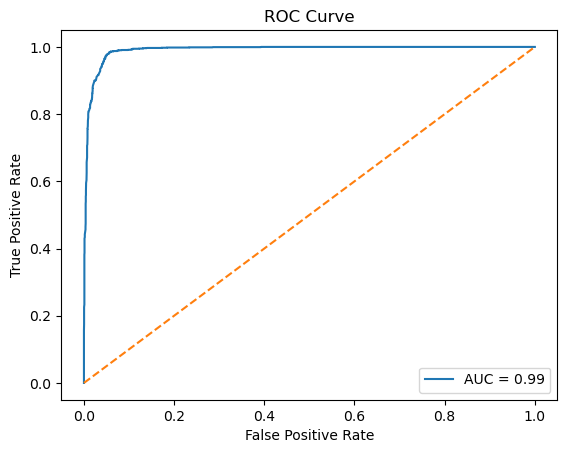

In [210]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

y_proba = ensemble_model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_proba)

plt.plot(fpr, tpr, label=f'AUC = {roc_auc_score(y_test, y_proba):.2f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


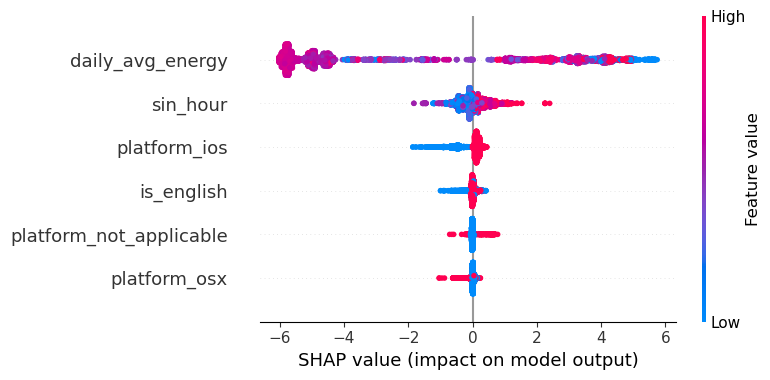

In [214]:
import shap

explainer = shap.TreeExplainer(ensemble_model.estimators_[1])  
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test)


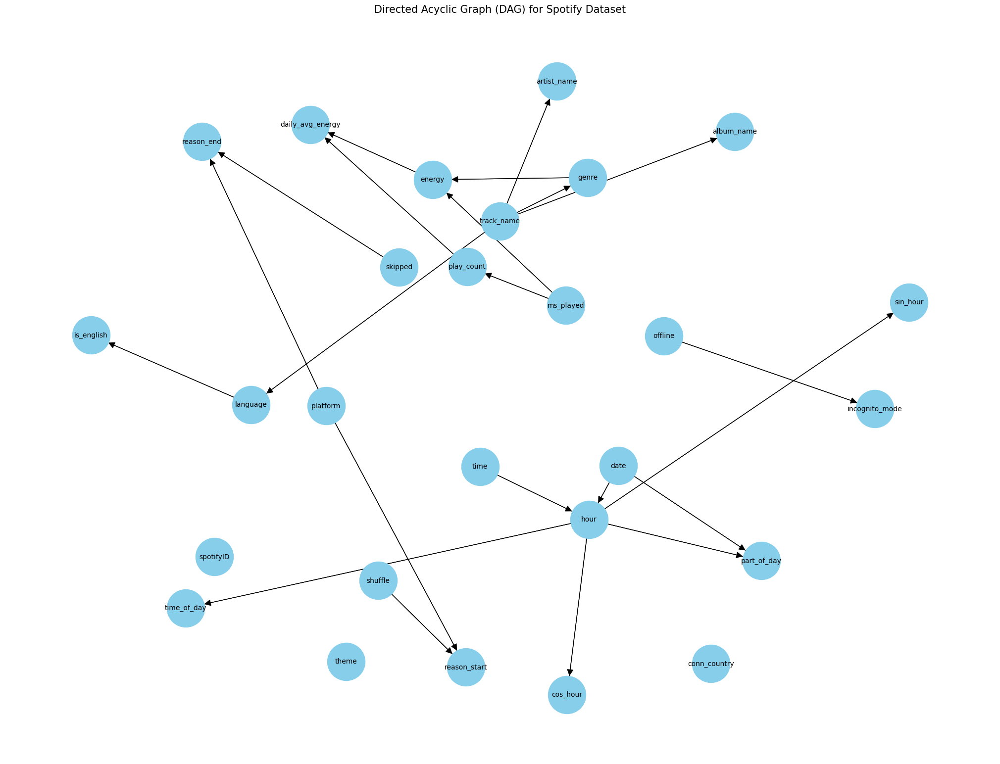

In [220]:
import networkx as nx
import matplotlib.pyplot as plt

# List of columns as nodes
nodes = [
    'date', 'time', 'conn_country', 'platform', 'track_name',
    'artist_name', 'album_name', 'ms_played', 'spotifyID', 'reason_start',
    'reason_end', 'shuffle', 'skipped', 'offline', 'incognito_mode',
    'play_count', 'genre', 'energy', 'theme', 'language', 'is_english',
    'daily_avg_energy', 'hour', 'part_of_day', 'time_of_day', 'sin_hour',
    'cos_hour'
]

# Define causal relationships (edges)
edges = [
    ('date', 'hour'),
    ('date', 'part_of_day'),
    ('time', 'hour'),
    ('hour', 'part_of_day'),
    ('hour', 'time_of_day'),
    ('hour', 'sin_hour'),
    ('hour', 'cos_hour'),
    ('track_name', 'artist_name'),
    ('track_name', 'album_name'),
    ('track_name', 'genre'),
    ('track_name', 'language'),
    ('language', 'is_english'),
    ('ms_played', 'play_count'),
    ('ms_played', 'energy'),
    ('genre', 'energy'),
    ('energy', 'daily_avg_energy'),
    ('shuffle', 'reason_start'),
    ('skipped', 'reason_end'),
    ('offline', 'incognito_mode'),
    ('platform', 'reason_start'),
    ('platform', 'reason_end'),
    ('play_count', 'daily_avg_energy')
]

# Create directed graph
G = nx.DiGraph()
G.add_nodes_from(nodes)
G.add_edges_from(edges)

# Draw the graph
plt.figure(figsize=(20, 15))
pos = nx.spring_layout(G, k=0.5)  # Adjust k for spacing
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=3000, arrowsize=20, font_size=10)
nx.draw_networkx_edges(G, pos, arrows=True)

plt.title('Directed Acyclic Graph (DAG) for Spotify Dataset', fontsize=15)
plt.show()


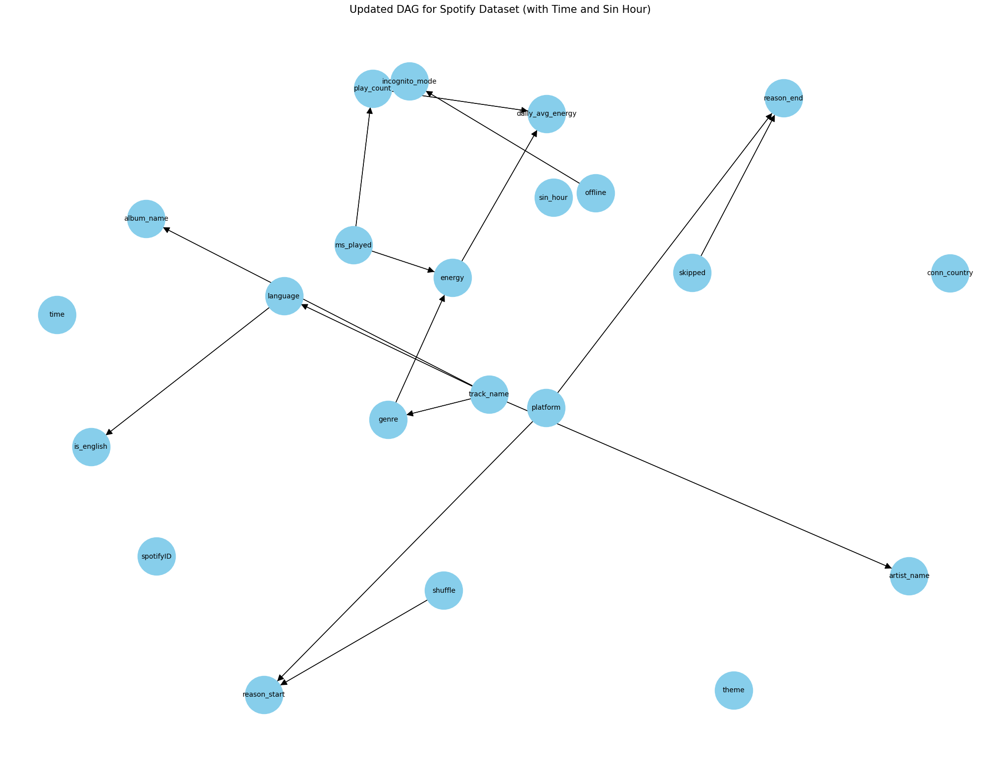

In [224]:
# Remove date and time related nodes except 'time' and 'sin_hour'
nodes_to_keep = {'time', 'sin_hour'}
nodes_to_remove = [node for node in nodes if ('date' in node or 'hour' in node or 'time_of_day' in node or 'part_of_day' in node or 'cos_hour' in node) and node not in nodes_to_keep]

# Remove nodes and corresponding edges
G.remove_nodes_from(nodes_to_remove)

# Draw the updated graph
plt.figure(figsize=(20, 15))
pos = nx.spring_layout(G, k=0.5)  # Adjust k for spacing
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=3000, arrowsize=20, font_size=10)
nx.draw_networkx_edges(G, pos, arrows=True)

plt.title('Updated DAG for Spotify Dataset (with Time and Sin Hour)', fontsize=15)
plt.show()
